# **Imports**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import string 
import re
import nltk
from nltk.corpus import stopwords 
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet', '/root/nltk_data/')
!unzip /root/nltk_data/corpora/wordnet.zip -d /root/nltk_data/corpora/
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

# **Data Exploration**

## **Train Data**

In [4]:
train_data = pd.read_csv('/kaggle/input/shai-training-2023-a-level-2/Train.csv')

In [5]:
train_data

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1
...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1
39996,This movie is an incredible piece of work. It ...,1
39997,My wife and I watched this movie because we pl...,0
39998,"When I first watched Flatliners, I was amazed....",1


In [6]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    40000 non-null  object
 1   label   40000 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 625.1+ KB


In [7]:
# checking null vallues 
train_data.isna().sum()

text     0
label    0
dtype: int64

In [8]:
train_data.duplicated().sum()

277

In [9]:
train_data.drop_duplicates(inplace=True)

In [10]:
train_data['label'].value_counts()

1    19908
0    19815
Name: label, dtype: int64

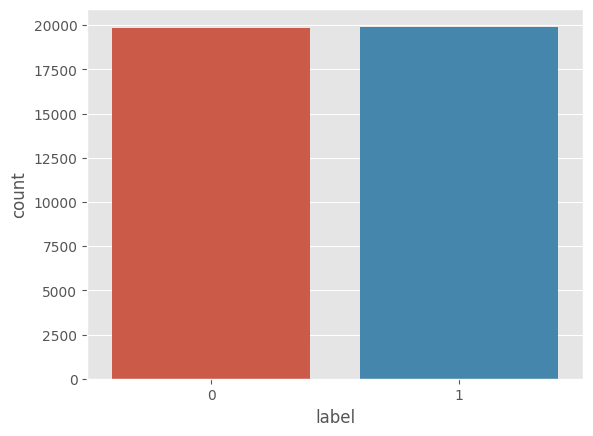

In [11]:
sns.countplot(x='label',data = train_data)
plt.show()

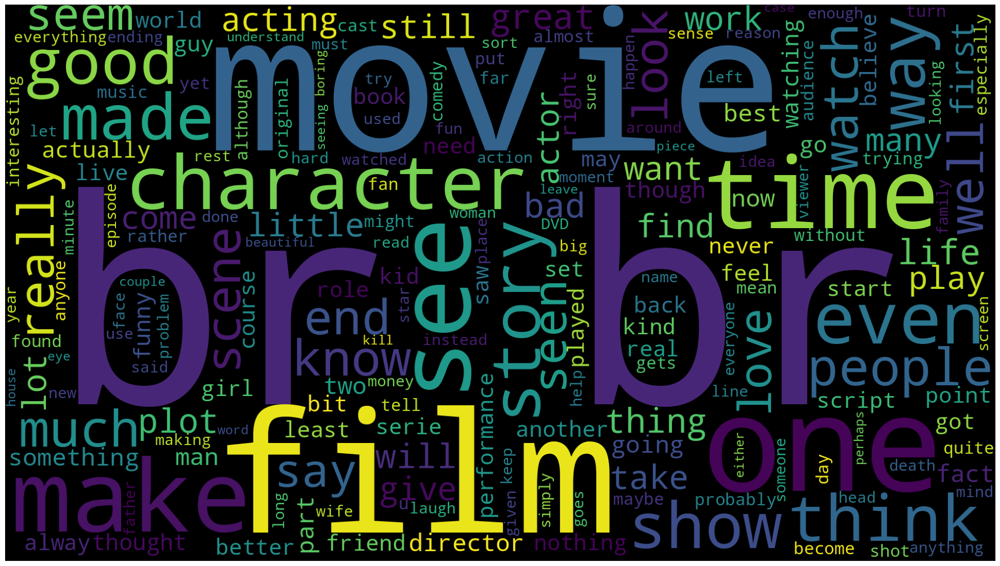

In [12]:
from wordcloud import WordCloud

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(train_data['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

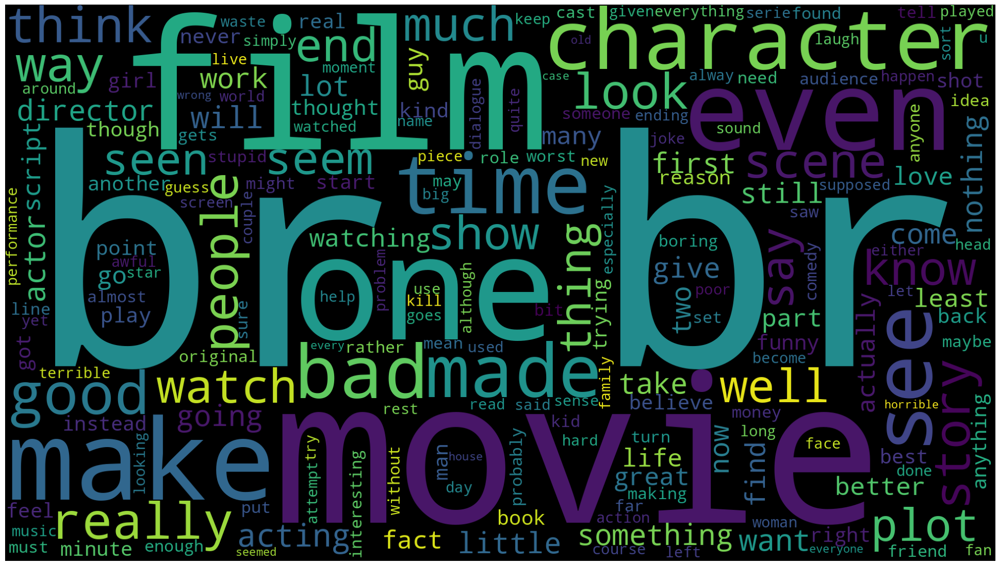

In [13]:
# Negative Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(train_data[train_data['label'] == 0]['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

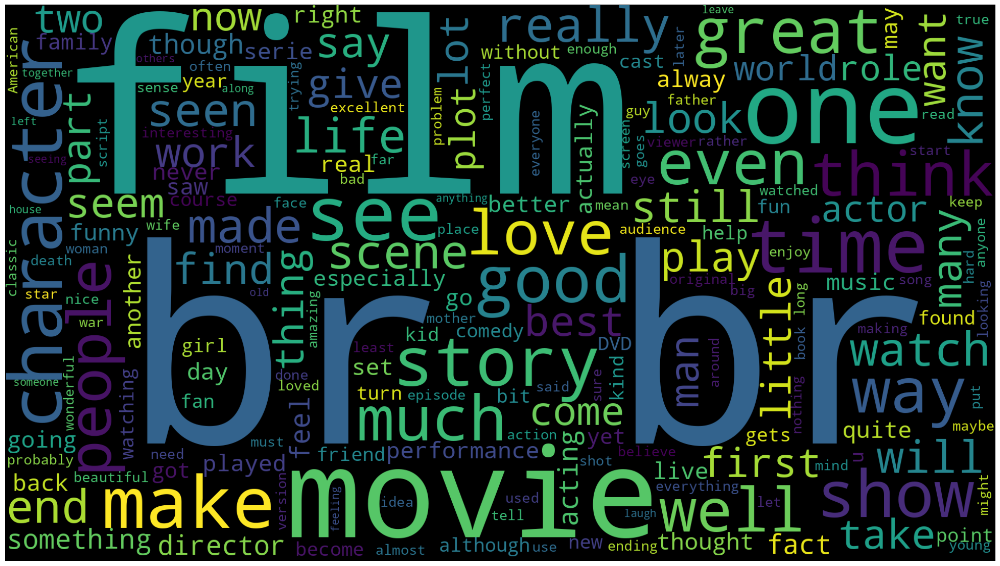

In [14]:
# Positive Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(train_data[train_data['label'] == 1]['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## **Val Data**

In [16]:
val_data = pd.read_csv('/kaggle/input/shai-training-2023-a-level-2/Valid.csv')

In [17]:
val_data

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0
...,...,...
4995,"Man, I loved this movie! This really takes me ...",1
4996,Recovery is an incredibly moving piece of work...,1
4997,"You can take the crook out of the joint, but i...",1
4998,FUTZ is the only show preserved from the exper...,1


In [18]:
val_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5000 non-null   object
 1   label   5000 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 78.2+ KB


In [19]:
# checking null vallues 
val_data.isna().sum()

text     0
label    0
dtype: int64

In [20]:
val_data.duplicated().sum()

2

In [21]:
val_data.drop_duplicates(inplace=True)

In [22]:
val_data['label'].value_counts()

1    2514
0    2484
Name: label, dtype: int64

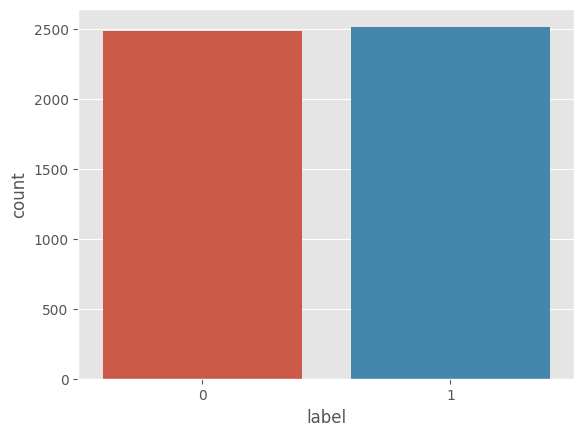

In [22]:
sns.countplot(x='label',data = val_data)
plt.show()

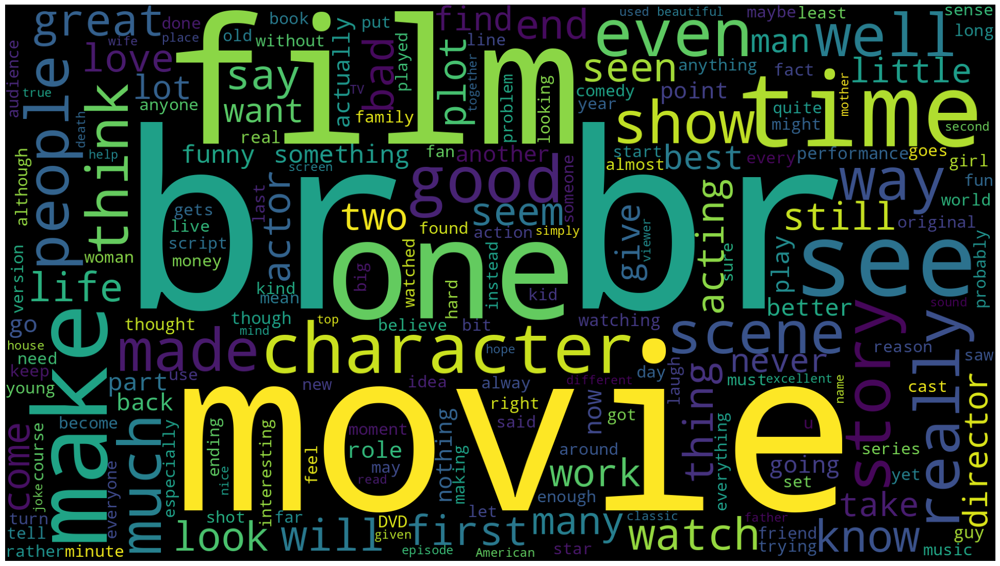

In [23]:
from wordcloud import WordCloud

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(val_data['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

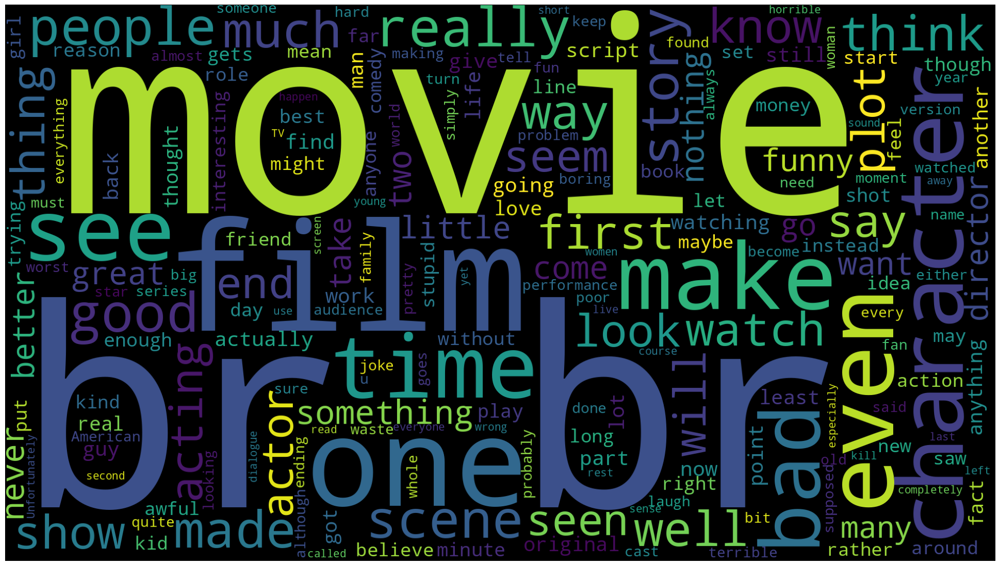

In [24]:
# Negative Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(val_data[val_data['label'] == 0]['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

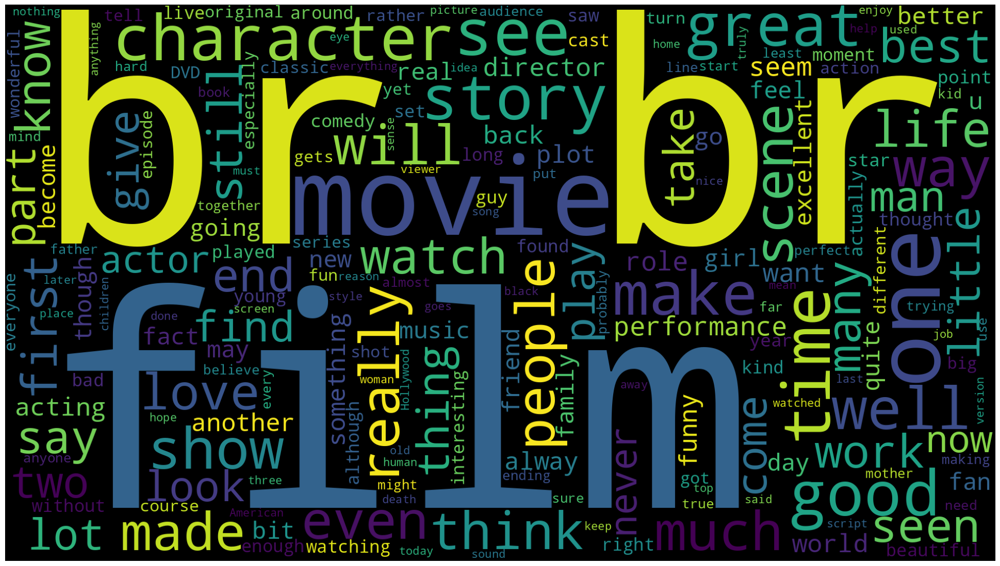

In [25]:
# Positive Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(val_data[val_data['label'] == 1]['text']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

- **We can notice that the data have many html tags specially `<br>`, We will handle it in the cleaning phase.**

# **Text Cleaning and Preprocessing**

## **Removing HTML Tags**

In [23]:
def remove_html(text):
    html_pattern = re.compile(r'<.*?>')
    return html_pattern.sub(r'', text)

train_data['htmlRemoved'] = train_data['text'].apply(remove_html)

train_data

,text,label,htmlRemoved
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa..."
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...
...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl..."
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed...."


## **Removing URL’s**

In [24]:
def remove_urls(text):
    url_pattern = re.compile(r'(https?://\S+)|(www\.\S+)|(\S+\.\S+/\S+)')
    return url_pattern.sub(r'', text)

train_data['urlsRemoved'] = train_data['text'].apply(remove_urls)

train_data

,text,label,htmlRemoved,urlsRemoved
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa..."
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...
...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl..."
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed...."


## **Removing Emoji and Emoticons**

In [25]:
def remove_emoji(text):
    emoji_pattern = re.compile("["
                                  u"\U0001F600-\U0001F64F"  # emoticons
                                  u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                  u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                  u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                  u"\U00002702-\U000027B0"  # other miscellaneous symbols
                                  u"\U000024C2-\U0001F251"  # enclosed characters
                                "]+", flags=re.UNICODE)
    
    return emoji_pattern.sub(r'', text)

train_data['emojiRemoved'] = train_data['urlsRemoved'].apply(remove_emoji)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa..."
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...
...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl..."
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed...."


## **Removing Punctuations**

In [26]:
# match all non-alphanumeric and non-whitespace characters,
def remove_punkt(text):
    punkt_pattern = re.compile(r"[^\w\s]")
    
    return punkt_pattern.sub(r'', text)


train_data['punkt'] = train_data['emojiRemoved'].apply(remove_punkt)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...
...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....",When I first watched Flatliners I was amazed I...


## **Removing Stop Words**

In [27]:
STOPWORDS = set(stopwords.words('english'))

# Function to remove the stopwords
def stopwords(text):
    return " ".join([word for word in text.split() if word not in STOPWORDS])

train_data['stopWord_Removed'] = train_data['punkt'].apply(stopwords)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt,stopWord_Removed
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...,I grew b 1965 watching loving Thunderbirds All...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...,When I put movie DVD player sat coke chips I e...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why people know particular time past like feel...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I great interest Biblical movies I...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im die hard Dads Army fan nothing ever change ...
...,...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...,Western Union something forgotten classic west...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...,This movie incredible piece work It explores e...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife I watched movie plan visit Sicily Stro...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....",When I first watched Flatliners I was amazed I...,When I first watched Flatliners I amazed It ne...


## **Lemmatization**

In [28]:
lemmatizer = nltk.stem.wordnet.WordNetLemmatizer()

def lemmatizeRows(text):
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])

train_data['lemmatizedRows'] = train_data['stopWord_Removed'].apply(lemmatizeRows)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt,stopWord_Removed,lemmatizedRows
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watching loving Thunderbirds All...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...,When I put movie DVD player sat coke chips I e...,When I put movie DVD player sat coke chip I ex...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why people know particular time past like feel...,Why people know particular time past like feel...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I great interest Biblical movies I...,Even though I great interest Biblical movie I ...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im die hard Dads Army fan nothing ever change ...,Im die hard Dads Army fan nothing ever change ...
...,...,...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...,Western Union something forgotten classic west...,Western Union something forgotten classic west...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...,This movie incredible piece work It explores e...,This movie incredible piece work It explores e...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife I watched movie plan visit Sicily Stro...,My wife I watched movie plan visit Sicily Stro...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....",When I first watched Flatliners I was amazed I...,When I first watched Flatliners I amazed It ne...,When I first watched Flatliners I amazed It ne...


## **Stemming**

In [29]:
stemmer = PorterStemmer()

def stemRows(text):
    return " ".join([stemmer.stem(word) for word in text.split()])

train_data['stemmedRows'] = train_data['lemmatizedRows'].apply(stemRows)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt,stopWord_Removed,lemmatizedRows,stemmedRows
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watch love thunderbird all mate ...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...,When I put movie DVD player sat coke chips I e...,When I put movie DVD player sat coke chip I ex...,when I put movi dvd player sat coke chip I exp...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why people know particular time past like feel...,Why people know particular time past like feel...,whi peopl know particular time past like feel ...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I great interest Biblical movies I...,Even though I great interest Biblical movie I ...,even though I great interest biblic movi I bor...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im die hard Dads Army fan nothing ever change ...,Im die hard Dads Army fan nothing ever change ...,Im die hard dad armi fan noth ever chang I got...
...,...,...,...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...,Western Union something forgotten classic west...,Western Union something forgotten classic west...,western union someth forgotten classic western...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...,This movie incredible piece work It explores e...,This movie incredible piece work It explores e...,thi movi incred piec work It explor everi nook...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife I watched movie plan visit Sicily Stro...,My wife I watched movie plan visit Sicily Stro...,My wife I watch movi plan visit sicili strombo...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....",When I first watched Flatliners I was amazed I...,When I first watched Flatliners I amazed It ne...,When I first watched Flatliners I amazed It ne...,when I first watch flatlin I amaz It necessari...


## **Tokens Cleaning**

In [30]:
def cleanData(text):

    ReapeatTokensRm =  " ".join( [ re.sub(r'(\w)\1{2,}', r'\1', word) for word in text.split()] )  # Remove repeating characters from tokens

    digitTokensRm =  " ".join( [ word for word in ReapeatTokensRm.split() if not re.search(r'\d', word) ] ) # Remove tokens containing digits

    underscoreTokensRm =  " ".join( [ word for word in digitTokensRm.split() if not re.search(r'_|\w*_\w*', word) ] ) # Remove tokens containing underscore

    specialTokensRm =  " ".join( [ word for word in underscoreTokensRm.split() if not re.search(r'[^a-zA-Z0-9\s]', word) ] ) # Remove tokens containing Special Characters

    return " ".join( [ word for word in specialTokensRm.split() if len(word) > 2 ] )  # Remove tokens less than 2 characters


train_data['cleanTokens'] = train_data['stemmedRows'].apply(cleanData)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt,stopWord_Removed,lemmatizedRows,stemmedRows,cleanTokens
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watch love thunderbird all mate ...,grew watch love thunderbird all mate school wa...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...,When I put movie DVD player sat coke chips I e...,When I put movie DVD player sat coke chip I ex...,when I put movi dvd player sat coke chip I exp...,when put movi dvd player sat coke chip expect ...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why people know particular time past like feel...,Why people know particular time past like feel...,whi peopl know particular time past like feel ...,whi peopl know particular time past like feel ...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I great interest Biblical movies I...,Even though I great interest Biblical movie I ...,even though I great interest biblic movi I bor...,even though great interest biblic movi bore de...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im die hard Dads Army fan nothing ever change ...,Im die hard Dads Army fan nothing ever change ...,Im die hard dad armi fan noth ever chang I got...,die hard dad armi fan noth ever chang got tape...
...,...,...,...,...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...,Western Union something forgotten classic west...,Western Union something forgotten classic west...,western union someth forgotten classic western...,western union someth forgotten classic western...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...,This movie incredible piece work It explores e...,This movie incredible piece work It explores e...,thi movi incred piec work It explor everi nook...,thi movi incred piec work explor everi nook cr...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife I watched movie plan visit Sicily Stro...,My wife I watched movie plan visit Sicily Stro...,My wife I watch movi plan visit sicili strombo...,wife watch movi plan visit sicili stromboli so...
39998,"When I first watched Flatliners, I was amazed....",1,"When I first watched Flatliners, I was amazed....","When I first watched Flatliners, I was amazed....","When I first

## **Visualizing Most Common Tokens**

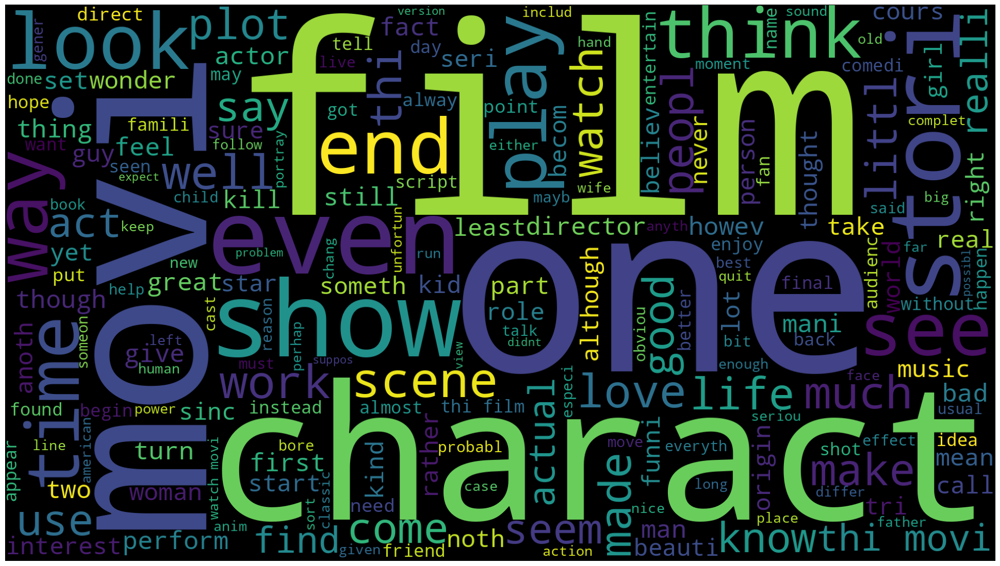

In [34]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='Black',
                      width=1920,
                      height=1080
                     ).generate(" ".join(train_data['cleanTokens']))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

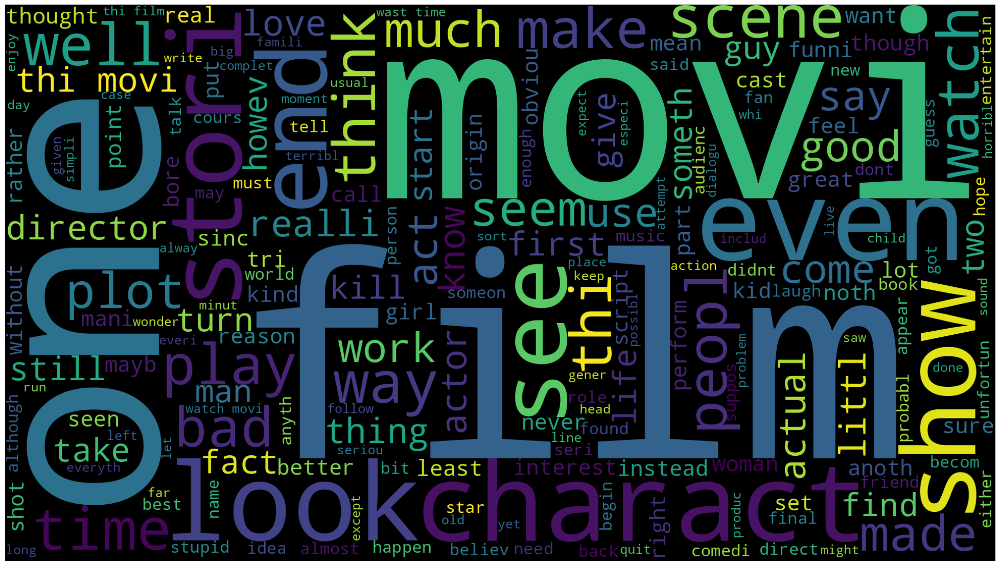

In [35]:
# Negative Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='Black',
                      width=1920,
                      height=1080
                     ).generate(" ".join(train_data[train_data['label'] == 0]['cleanTokens']))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

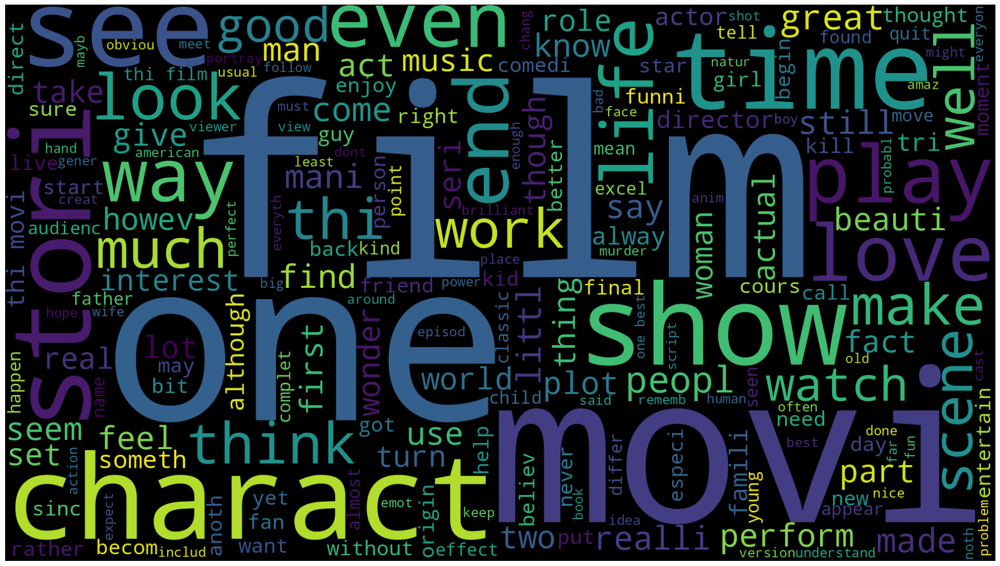

In [36]:
# Positive Reviews Most Common Words

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='Black',
                      width=1920,
                      height=1080
                     ).generate(" ".join(train_data[train_data['label'] == 1]['cleanTokens']))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## **TF-IDF Vectorization**

- **Sinice movie reviews are long sentence(most of them are longer than 200 words) we will try different ngrams combinations.**

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer

Vectorizer = TfidfVectorizer(max_features=10000, min_df=0.0001, max_df=0.7, ngram_range=(1,5))

trainDataVectorized = Vectorizer.fit_transform(train_data['cleanTokens'])

feature_names = Vectorizer.get_feature_names_out()

pd.DataFrame(trainDataVectorized.toarray(), columns = feature_names)

,aaron,abandon,abbott,abc,abduct,abil,abl,abl get,abl see,aboard,...,zani,zealand,zellweg,zero,zizek,zoey,zombi,zombi movi,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39718,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39719,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39720,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
feature_names[:1000]

array(['aaron', 'abandon', 'abbott', 'abc', 'abduct', 'abil', 'abl',
       'abl get', 'abl see', 'aboard', 'abomin', 'abort', 'abound',
       'about', 'aboutbr', 'abraham', 'abrupt', 'abruptli', 'absenc',
       'absent', 'absolut', 'absolut love', 'absolut noth',
       'absolut worst', 'absorb', 'abstract', 'absurd', 'abund', 'abus',
       'abysm', 'academi', 'academi award', 'accent', 'accept', 'access',
       'accid', 'accident', 'acclaim', 'accompani', 'accomplish',
       'accord', 'account', 'accur', 'accuraci', 'accus', 'ace', 'achiev',
       'acid', 'acknowledg', 'acquaint', 'acquir', 'across', 'act',
       'act abil', 'act also', 'act bad', 'act direct', 'act even',
       'act film', 'act good', 'act great', 'act horribl', 'act isnt',
       'act like', 'act movi', 'act one', 'act part', 'act perform',
       'act poor', 'act pretti', 'act realli', 'act skill', 'act superb',
       'act talent', 'act terribl', 'act the', 'act way', 'act well',
       'actingbr', 'actio

# **Text Cleaning Pipeline**

In [37]:
html_pattern = re.compile(r'<.*?>')

url_pattern = re.compile(r'(https?://\S+)|(www\.\S+)|(\S+\.\S+/\S+)')

emoji_pattern = re.compile("["
                                  u"\U0001F600-\U0001F64F"  # emoticons
                                  u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                  u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                  u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                  u"\U00002702-\U000027B0"  # other miscellaneous symbols
                                  u"\U000024C2-\U0001F251"  # enclosed characters
                                "]+", flags=re.UNICODE)

punkt_pattern = re.compile(r"[^\w\s]")

STOPWORDS = set(stopwords.words('english'))

lemmatizer = nltk.stem.wordnet.WordNetLemmatizer()

stemmer = PorterStemmer()

In [38]:
def cleanTextPipeline(text):

    htmlTokensRm =  " ".join( [ html_pattern.sub(r'', word) for word in text.split() ] ) # Remove tokens containing html tags

    urlTokensRm =  " ".join( [ url_pattern.sub(r'', word) for word in htmlTokensRm.split() ] ) # Remove tokens containing urls

    emojiTokensRm =  " ".join( [ emoji_pattern.sub(r'', word) for word in urlTokensRm.split() ] ) # Remove tokens containing emojis

    punktTokensRm =  " ".join( [ punkt_pattern.sub(r'', word) for word in emojiTokensRm.split() ] ) # Remove tokens containing Punctuations

    stopWordsRm =  " ".join( [ word for word in punktTokensRm.split() if word not in STOPWORDS ] ) # Remove tokens containing stopwords

    lemmtizedTokensRm =  " ".join( [ lemmatizer.lemmatize(word) for word in stopWordsRm.split() ] ) # Lemmatize Tokens

    stemmedTokensRm =  " ".join( [ stemmer.stem(word) for word in lemmtizedTokensRm.split() ] ) # Stem Tokens

    ReapeatTokensRm =  " ".join( [ re.sub(r'(\w)\1{2,}', r'\1', word) for word in stemmedTokensRm.split()] )  # Remove repeating characters from tokens

    digitTokensRm =  " ".join( [ word for word in ReapeatTokensRm.split() if not re.search(r'\d', word) ] ) # Remove tokens containing digits

    underscoreTokensRm =  " ".join( [ word for word in digitTokensRm.split() if not re.search(r'_|\w*_\w*', word) ] ) # Remove tokens containing underscore

    specialTokensRm =  " ".join( [ word for word in underscoreTokensRm.split() if not re.search(r'[^a-zA-Z0-9\s]', word) ] ) # Remove tokens containing Special Characters
    
    cleanTokens =" ".join( [ word for word in specialTokensRm.split() if len(word) > 2 ] )  # Remove tokens less than 2 characters

    return cleanTokens

In [39]:
train_data['cleanPipelineTokens'] = train_data['text'].apply(cleanTextPipeline)

train_data

,text,label,htmlRemoved,urlsRemoved,emojiRemoved,punkt,stopWord_Removed,lemmatizedRows,stemmedRows,cleanTokens,cleanPipelineTokens
0,I grew up (b. 1965) watching and loving the Th...,0,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up (b. 1965) watching and loving the Th...,I grew up b 1965 watching and loving the Thund...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watching loving Thunderbirds All...,I grew b 1965 watch love thunderbird all mate ...,grew watch love thunderbird all mate school wa...,grew watch love thunderbird all mate school wa...
1,"When I put this movie in my DVD player, and sa...",0,"When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...","When I put this movie in my DVD player, and sa...",When I put this movie in my DVD player and sat...,When I put movie DVD player sat coke chips I e...,When I put movie DVD player sat coke chip I ex...,when I put movi dvd player sat coke chip I exp...,when put movi dvd player sat coke chip expect ...,when put movi dvd player sat coke chip expect ...
2,Why do people who do not know what a particula...,0,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why do people who do not know what a particula...,Why people know particular time past like feel...,Why people know particular time past like feel...,whi peopl know particular time past like feel ...,whi peopl know particular time past like feel ...,whi peopl know particular time past like feel ...
3,Even though I have great interest in Biblical ...,0,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I have great interest in Biblical ...,Even though I great interest Biblical movies I...,Even though I great interest Biblical movie I ...,even though I great interest biblic movi I bor...,even though great interest biblic movi bore de...,even though great interest biblic movi bore de...
4,Im a die hard Dads Army fan and nothing will e...,1,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im a die hard Dads Army fan and nothing will e...,Im die hard Dads Army fan nothing ever change ...,Im die hard Dads Army fan nothing ever change ...,Im die hard dad armi fan noth ever chang I got...,die hard dad armi fan noth ever chang got tape...,die hard dad armi fan noth ever chang got tape...
...,...,...,...,...,...,...,...,...,...,...,...
39995,"""Western Union"" is something of a forgotten cl...",1,"""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...","""Western Union"" is something of a forgotten cl...",Western Union is something of a forgotten clas...,Western Union something forgotten classic west...,Western Union something forgotten classic west...,western union someth forgotten classic western...,western union someth forgotten classic western...,western union someth forgotten classic western...
39996,This movie is an incredible piece of work. It ...,1,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work. It ...,This movie is an incredible piece of work It e...,This movie incredible piece work It explores e...,This movie incredible piece work It explores e...,thi movi incred piec work It explor everi nook...,thi movi incred piec work explor everi nook cr...,thi movi incred piec work explor everi nook cr...
39997,My wife and I watched this movie because we pl...,0,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My wife and I watched this movie because we pl...,My 

In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer

Vectorizer = TfidfVectorizer(max_features=10000, min_df=0.0001, max_df=0.7, ngram_range=(1,3))

trainDataVectorized = Vectorizer.fit_transform(train_data['cleanPipelineTokens'])

feature_names = Vectorizer.get_feature_names_out()

pd.DataFrame(trainDataVectorized.toarray(), columns = feature_names)

,aaron,abandon,abbott,abc,abduct,abil,abl,abl get,abl see,aboard,...,zani,zealand,zellweg,zero,zizek,zoey,zombi,zombi movi,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39718,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39719,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39720,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
val_data['cleanPipelineTokens'] = val_data['text'].apply(cleanTextPipeline)

val_data

,text,label,cleanPipelineTokens
0,It's been about 14 years since Sharon Stone aw...,0,year sinc sharon stone award viewer legcross t...
1,someone needed to make a car payment... this i...,0,someon need make car payment truli make jean c...
2,The Guidelines state that a comment must conta...,0,the guidelin state comment must contain minimu...
3,This movie is a muddled mish-mash of clichés f...,0,thi movi muddl mishmash recent cinema there pr...
4,Before Stan Laurel became the smaller half of ...,0,befor stan laurel becam smaller half alltim gr...
...,...,...,...
4995,"Man, I loved this movie! This really takes me ...",1,man love movi thi realli take back kid these d...
4996,Recovery is an incredibly moving piece of work...,1,recoveri incred move piec work handl devast ef...
4997,"You can take the crook out of the joint, but i...",1,you take crook joint seem exceedingli difficul...
4998,FUTZ is the only show preserved from the exper...,1,futz show preserv experiment theatr movement n...


In [42]:
testDataVectorized = Vectorizer.transform(val_data['cleanPipelineTokens'])

feature_names = Vectorizer.get_feature_names_out()

pd.DataFrame(testDataVectorized.toarray(), columns = feature_names)

,aaron,abandon,abbott,abc,abduct,abil,abl,abl get,abl see,aboard,...,zani,zealand,zellweg,zero,zizek,zoey,zombi,zombi movi,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4994,0.0,0.0,0.0,0.0,0.0,0.0,0.068677,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4995,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4996,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
feature_names[:1000]

array(['aaron', 'abandon', 'abbott', 'abc', 'abduct', 'abil', 'abl',
       'abl get', 'abl see', 'aboard', 'abomin', 'abort', 'abound',
       'about', 'aboutbr', 'abraham', 'abrupt', 'abruptli', 'absenc',
       'absent', 'absolut', 'absolut love', 'absolut noth',
       'absolut worst', 'absorb', 'abstract', 'absurd', 'abund', 'abus',
       'abysm', 'academi', 'academi award', 'accent', 'accept', 'access',
       'accid', 'accident', 'acclaim', 'accompani', 'accomplish',
       'accord', 'account', 'accur', 'accuraci', 'accus', 'ace', 'achiev',
       'acid', 'acknowledg', 'acquaint', 'acquir', 'across', 'act',
       'act abil', 'act also', 'act bad', 'act direct', 'act even',
       'act film', 'act good', 'act great', 'act horribl', 'act isnt',
       'act like', 'act movi', 'act one', 'act part', 'act perform',
       'act poor', 'act pretti', 'act realli', 'act skill', 'act superb',
       'act talent', 'act terribl', 'act the', 'act way', 'act well',
       'actingbr', 'actio

# **Splitting Data**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val ,y_train ,y_val = train_test_split(trainDataVectorized.toarray(), train_data['label'], test_size=0.1,
                                                    stratify= train_data['label']  , random_state=0)

X_train.shape, y_train.shape, X_val.shape, y_val.shape

((35750, 2000), (35750,), (3973, 2000), (3973,))

In [ ]:
X_test = testDataVectorized.toarray()
y_test = val_data['label']

X_test.shape, y_test.shape,

((4998, 2000), (4998,))

In [ ]:
X_allData = np.concatenate([X_train, X_val, X_test], axis = 0)

y_allData = np.concatenate([y_train, y_val, y_test], axis = 0)

X_allData.shape, y_allData.shape

((44721, 2000), (44721,))

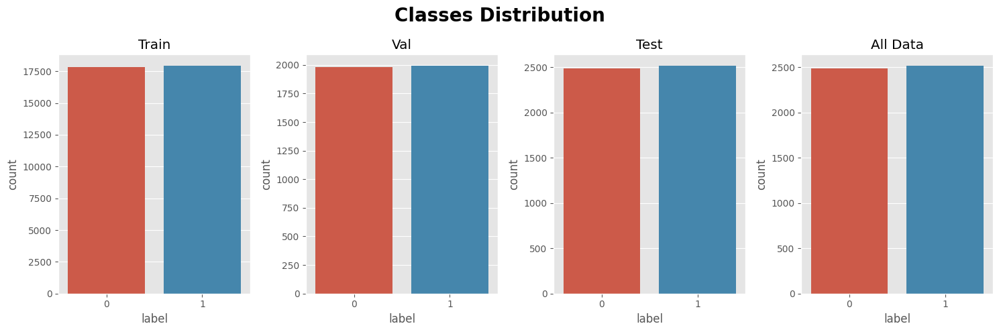

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5))  # Creating subplots

sns.countplot(x=y_train, ax=axes[0])
axes[0].set_title('Train')

sns.countplot(x=y_val, ax=axes[1])
axes[1].set_title('Val')

sns.countplot(x=y_test, ax=axes[2])
axes[2].set_title('Test')

sns.countplot(x=y_test, ax=axes[3])
axes[3].set_title('All Data')

fig.suptitle('Classes Distribution', fontsize=20, fontweight='bold')
plt.tight_layout()  # To prevent overlapping labels
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,roc_curve, roc_auc_score

def make_classification_plots(labels, model_preds, title):

  fig, axes = plt.subplots(1, 2, figsize=(15, 5))

  cm_matrix = confusion_matrix(labels, model_preds)

  # 1 - Summary Statistics
  TN, FP, FN, TP = cm_matrix.ravel() # cm[0,0], cm[0, 1], cm[1, 0], cm[1, 1]
  accuracy = (TP + TN) / np.sum(cm_matrix) # % positive out of all predicted positives
  precision = TP / (TP+FP) # % positive out of all predicted positives
  recall =  TP / (TP+FN) # % positive out of all supposed to be positives
  specificity = TN / (TN+FP) # % negative out of all supposed to be negatives
  f1 = 2*precision*recall / (precision + recall)
  stats_summary = '[Summary Statistics]\nAccuracy = {:.2%} | Precision = {:.2%} | Recall = {:.2%} | Specificity = {:.2%} | F1 Score = {:.2%}'.format(accuracy, precision, recall, specificity, f1)
  print(stats_summary)

  # 2 : Confusion Matrix 
  categories = ['Negative','Positive']

  group_names = ['True Negative','False Positive', 'False Negative','True Positive']

  group_percentages = ['{0:.2%}'.format(value) for value in cm_matrix.flatten() / np.sum(cm_matrix)]

  cm_lables = [f'{v1}\n{v2} ({v3})' for v1, v2 ,v3 in zip(group_names,cm_matrix.flatten(),group_percentages)]

  cm_lables = np.asarray(cm_lables).reshape(2,2)

  sns.heatmap(cm_matrix, annot = cm_lables,fmt = '',
  xticklabels = categories, yticklabels = categories, ax = axes[0])

  axes[0].set_xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
  axes[0].set_ylabel("Actual values" , fontdict = {'size':14}, labelpad = 10)
  axes[0].set_title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)


  # 3 : ROC CURVE
  fpr, tpr, thresholds = roc_curve(labels, model_preds)
  auc = roc_auc_score(labels, model_preds)
  axes[1].set_title('ROC Curve')
  axes[1].plot([0, 1], [0, 1], 'k--', label = "Random (AUC = 50%)")
  axes[1].plot(fpr, tpr, label=f'{title} (AUC = {round(auc*100,2)}%)')
  axes[1].set_xlabel('False Positive Rate', size=14)
  axes[1].set_ylabel('True Positive Rate', size=14)
  axes[1].legend(loc='best')

  fig.suptitle(f"{title} Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  # 4 : Classification Report
  class_report = classification_report(labels, model_preds, target_names = categories)
  print('\n', f"{title} Classification Report: \n {class_report}")

In [ ]:
from sklearn.model_selection import cross_val_score

def test_performence(model, cv=3):
    
    # Accuracy Comparison
    acc_train = model.score(X_train, y_train)
    acc_val = model.score(X_val, y_val)
    acc_test = model.score(X_test, y_test)

    acc_df = pd.DataFrame({'Train': acc_train,'Val': acc_val,'Test': acc_test}, index= ['Accuracy']).T

    # Model Predictions
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)
    
    # Roc Score Comparison
    roc_train = roc_auc_score(y_pred_train, y_train)
    roc_val = roc_auc_score(y_pred_val, y_val)
    roc_test = roc_auc_score(y_pred_test, y_test)

    roc_df = pd.DataFrame({'Train': roc_train,'Val': roc_val,'Test': roc_test}, index= ['Roc Score']).T

    # Displaying Scores
    results_df = pd.concat([acc_df,roc_df], axis=1)

    display(results_df.style.background_gradient(cmap='YlOrRd', axis=0))

    # Cross Validation
    model_cv_acc = cross_val_score(model, X_allData, y_allData, scoring="accuracy", cv=cv)

    cv_scores_df = pd.DataFrame([pd.Series(model_cv_acc).describe().T], index=['Model Cross-Val Scores']).T

    display(cv_scores_df.style.background_gradient(cmap='BuPu', axis=1))

# **Machine Learning Models**

# **Linear Models**

In [39]:
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=500)

sgd = SGDClassifier(random_state=0)

svc = LinearSVC(random_state=0)

nb = MultinomialNB()

ridge = RidgeClassifier(random_state=0)

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=500)

sgd = SGDClassifier(random_state=0)

svc = LinearSVC(random_state=0)

nb = MultinomialNB()

ridge = RidgeClassifier(random_state=0)

In [ ]:
lr.fit(X_train, y_train)

test_performence(lr)

,Accuracy,Roc Score
Train,0.926573,0.926740
Val,0.896552,0.896562
Test,0.890356,0.890786


,Model Cross-Val Scores
count,3.000000
mean,0.891773
std,0.000571
min,0.891192
25%,0.891494
50%,0.891796
75%,0.892064
max,0.892332


[Summary Statistics]
Accuracy = 89.04% | Precision = 87.92% | Recall = 90.65% | Specificity = 87.40% | F1 Score = 89.27%


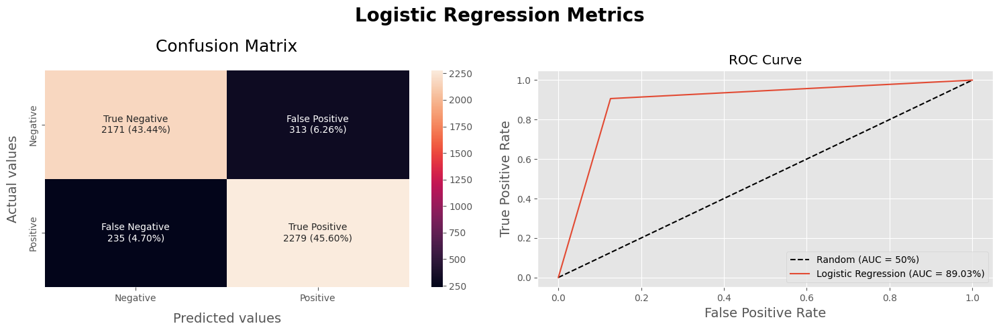


 Logistic Regression Classification Report: 
               precision    recall  f1-score   support

    Negative       0.90      0.87      0.89      2484
    Positive       0.88      0.91      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
lrPreds = lr.predict(X_test)

make_classification_plots(y_test, lrPreds, 'Logistic Regression')

In [ ]:
sgd.fit(X_train, y_train)

test_performence(sgd)

,Accuracy,Roc Score
Train,0.923580,0.924044
Val,0.896552,0.896897
Test,0.889956,0.890999


,Model Cross-Val Scores
count,3.000000
mean,0.891930
std,0.001220
min,0.891192
25%,0.891226
50%,0.891259
75%,0.892299
max,0.893339


[Summary Statistics]
Accuracy = 89.00% | Precision = 87.23% | Recall = 91.53% | Specificity = 86.43% | F1 Score = 89.32%


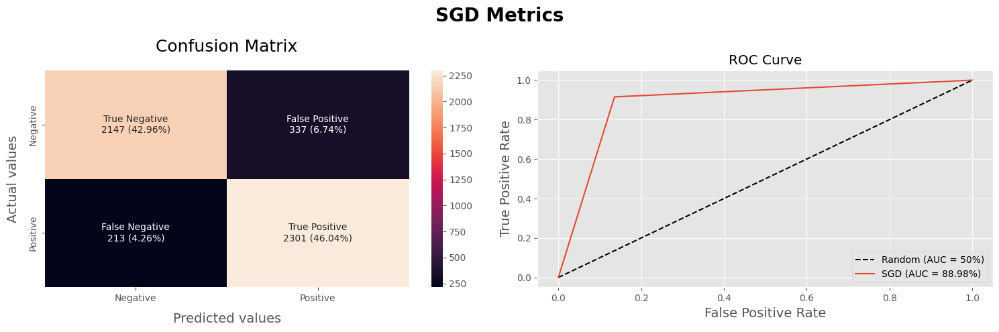


 SGD Classification Report: 
               precision    recall  f1-score   support

    Negative       0.91      0.86      0.89      2484
    Positive       0.87      0.92      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
sgdPreds = sgd.predict(X_test)

make_classification_plots(y_test, sgdPreds, 'SGD')

In [ ]:
svc.fit(X_train, y_train)

test_performence(svc)

,Accuracy,Roc Score
Train,0.974713,0.974747
Val,0.894790,0.894845
Test,0.887955,0.888231


,Model Cross-Val Scores
count,3.000000
mean,0.888911
std,0.002036
min,0.886563
25%,0.888274
50%,0.889985
75%,0.890085
max,0.890186


[Summary Statistics]
Accuracy = 88.80% | Precision = 87.93% | Recall = 90.10% | Specificity = 87.48% | F1 Score = 89.00%


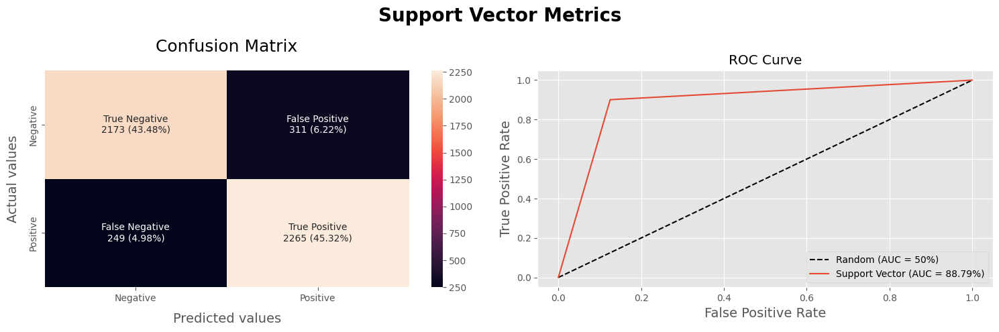


 Support Vector Classification Report: 
               precision    recall  f1-score   support

    Negative       0.90      0.87      0.89      2484
    Positive       0.88      0.90      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
svcPreds = svc.predict(X_test)

make_classification_plots(y_test, svcPreds, 'Support Vector')

In [ ]:
nb.fit(X_train, y_train)

test_performence(nb)

,Accuracy,Roc Score
Train,0.886825,0.887233
Val,0.875157,0.875699
Test,0.862545,0.863264


,Model Cross-Val Scores
count,3.000000
mean,0.868026
std,0.002080
min,0.866506
25%,0.866841
50%,0.867176
75%,0.868786
max,0.870396


[Summary Statistics]
Accuracy = 86.25% | Precision = 84.85% | Recall = 88.46% | Specificity = 84.02% | F1 Score = 86.62%


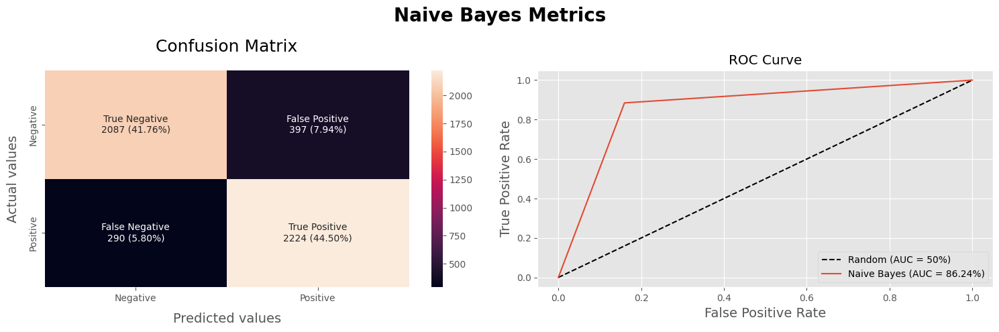


 Naive Bayes Classification Report: 
               precision    recall  f1-score   support

    Negative       0.88      0.84      0.86      2484
    Positive       0.85      0.88      0.87      2514

    accuracy                           0.86      4998
   macro avg       0.86      0.86      0.86      4998
weighted avg       0.86      0.86      0.86      4998



In [ ]:
nbPreds = nb.predict(X_test)

make_classification_plots(y_test, nbPreds, 'Naive Bayes')

In [ ]:
ridge.fit(X_train, y_train)

test_performence(ridge)

,Accuracy,Roc Score
Train,0.946266,0.946401
Val,0.894790,0.894946
Test,0.888355,0.888847


,Model Cross-Val Scores
count,3.000000
mean,0.884953
std,0.001296
min,0.883545
25%,0.884383
50%,0.885222
75%,0.885658
max,0.886094


[Summary Statistics]
Accuracy = 88.84% | Precision = 87.64% | Recall = 90.57% | Specificity = 87.08% | F1 Score = 89.08%


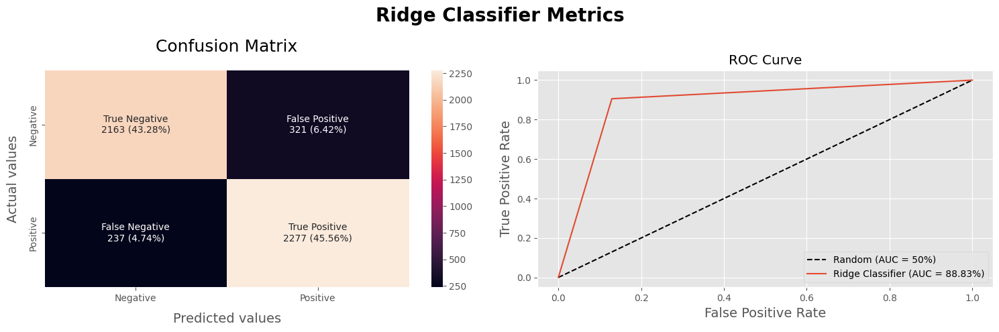


 Ridge Classifier Classification Report: 
               precision    recall  f1-score   support

    Negative       0.90      0.87      0.89      2484
    Positive       0.88      0.91      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
ridgePreds = ridge.predict(X_test)

make_classification_plots(y_test, ridgePreds, 'Ridge Classifier')

# **Boosting and Ensemble Models**

In [ ]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [ ]:
rf = RandomForestClassifier(random_state=0)

extrees = ExtraTreesClassifier(random_state=0)

xgb = XGBClassifier(random_state=0)

lgbm = LGBMClassifier(random_state=0)

cat = CatBoostClassifier(random_state=0, verbose=False)

In [ ]:
rf.fit(X_train, y_train)

test_performence(rf)

,Accuracy,Roc Score
Train,1.000000,1.000000
Val,0.850239,0.850317
Test,0.843137,0.843131


,Model Cross-Val Scores
count,3.000000
mean,0.842580
std,0.002219
min,0.840276
25%,0.841517
50%,0.842758
75%,0.843731
max,0.844704


[Summary Statistics]

Accuracy = 84.31% | Precision = 84.46% | Recall = 84.33% | Specificity = 84.30% | F1 Score = 84.39%


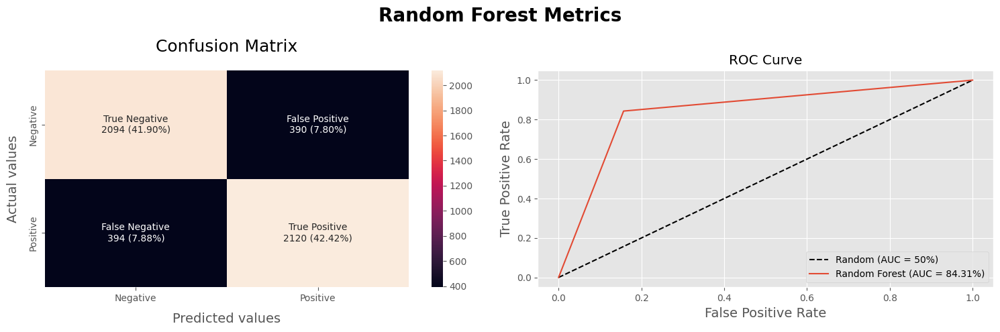



 Random Forest Classification Report: 

               precision    recall  f1-score   support



    Negative       0.84      0.84      0.84      2484

    Positive       0.84      0.84      0.84      2514



    accuracy                           0.84      4998

   macro avg       0.84      0.84      0.84      4998

weighted avg       0.84      0.84      0.84      4998




In [ ]:
rfPreds = rf.predict(X_test)

make_classification_plots(y_test, rfPreds, 'Random Forest')

In [ ]:
extrees.fit(X_train, y_train)

test_performence(extrees)

,Accuracy,Roc Score
Train,1.000000,1.000000
Val,0.859804,0.859831
Test,0.857943,0.857971


,Model Cross-Val Scores
count,3.000000
mean,0.858903
std,0.000387
min,0.858456
25%,0.858791
50%,0.859127
75%,0.859127
max,0.859127


[Summary Statistics]

Accuracy = 85.79% | Precision = 85.60% | Recall = 86.28% | Specificity = 85.31% | F1 Score = 85.94%


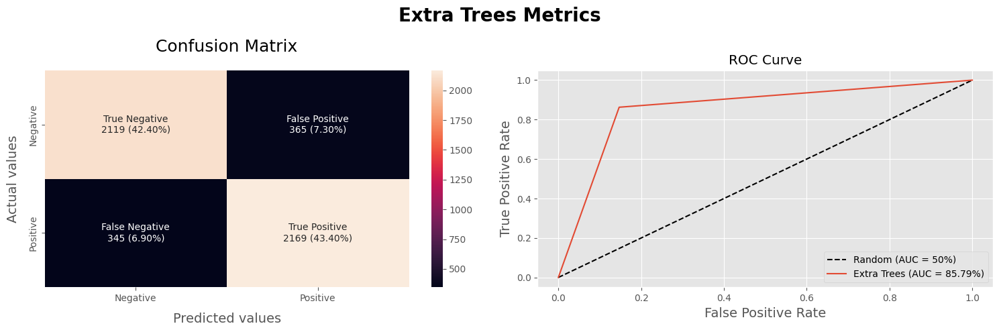



 Extra Trees Classification Report: 

               precision    recall  f1-score   support



    Negative       0.86      0.85      0.86      2484

    Positive       0.86      0.86      0.86      2514



    accuracy                           0.86      4998

   macro avg       0.86      0.86      0.86      4998

weighted avg       0.86      0.86      0.86      4998




In [ ]:
extreesPreds = extrees.predict(X_test)

make_classification_plots(y_test, extreesPreds, 'Extra Trees')

In [ ]:
xgb.fit(X_train, y_train)

test_performence(xgb)

,Accuracy,Roc Score
Train,0.933678,0.934158
Val,0.860307,0.860685
Test,0.853341,0.854039


,Model Cross-Val Scores
count,3.000000
mean,0.850451
std,0.002471
min,0.848796
25%,0.849031
50%,0.849265
75%,0.851278
max,0.853290


[Summary Statistics]

Accuracy = 85.33% | Precision = 83.98% | Recall = 87.55% | Specificity = 83.09% | F1 Score = 85.73%


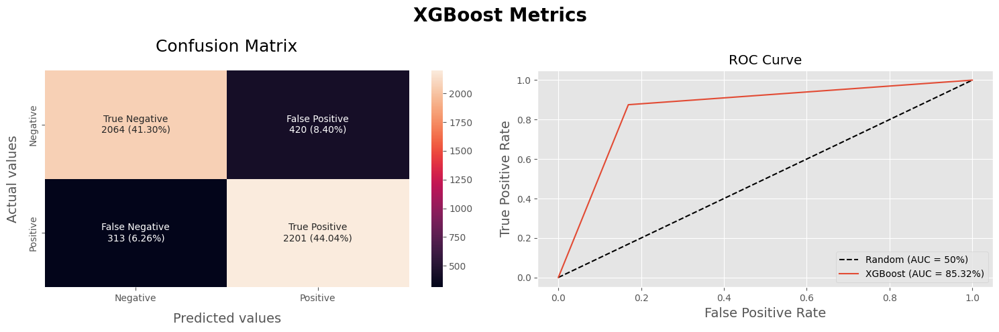



 XGBoost Classification Report: 

               precision    recall  f1-score   support



    Negative       0.87      0.83      0.85      2484

    Positive       0.84      0.88      0.86      2514



    accuracy                           0.85      4998

   macro avg       0.85      0.85      0.85      4998

weighted avg       0.85      0.85      0.85      4998




In [ ]:
xgbPreds = xgb.predict(X_test)

make_classification_plots(y_test, xgbPreds, 'XGBoost')

In [ ]:
lgbm.fit(X_train, y_train)

test_performence(lgbm)

,Accuracy,Roc Score
Train,0.899832,0.900106
Val,0.860055,0.860082
Test,0.853541,0.854040


,Model Cross-Val Scores
count,3.000000
mean,0.856153
std,0.000724
min,0.855638
25%,0.855739
50%,0.855840
75%,0.856410
max,0.856980


[Summary Statistics]

Accuracy = 85.35% | Precision = 84.22% | Recall = 87.23% | Specificity = 83.45% | F1 Score = 85.70%


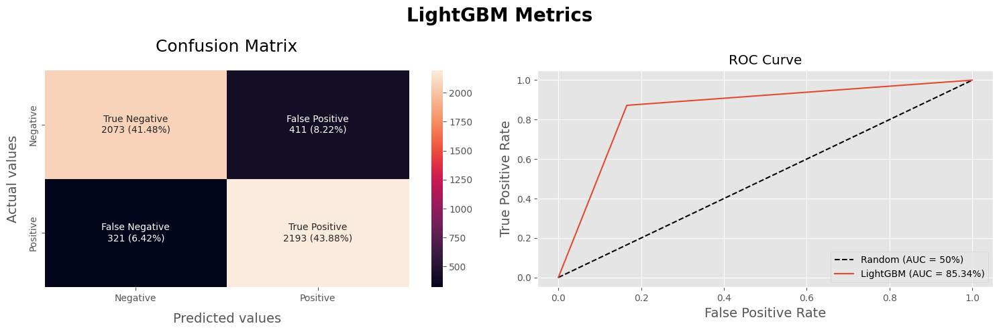



 LightGBM Classification Report: 

               precision    recall  f1-score   support



    Negative       0.87      0.83      0.85      2484

    Positive       0.84      0.87      0.86      2514



    accuracy                           0.85      4998

   macro avg       0.85      0.85      0.85      4998

weighted avg       0.85      0.85      0.85      4998




In [ ]:
lgbmPreds = lgbm.predict(X_test)

make_classification_plots(y_test, lgbmPreds, 'LightGBM')

In [ ]:
cat.fit(X_train, y_train)

test_performence(cat)

,Accuracy,Roc Score
Train,0.921650,0.922073
Val,0.869368,0.869807
Test,0.869748,0.870333


,Model Cross-Val Scores
count,3.000000
mean,0.866170
std,0.000537
min,0.865634
25%,0.865902
50%,0.866170
75%,0.866439
max,0.866707


[Summary Statistics]

Accuracy = 86.97% | Precision = 85.70% | Recall = 88.94% | Specificity = 84.98% | F1 Score = 87.29%


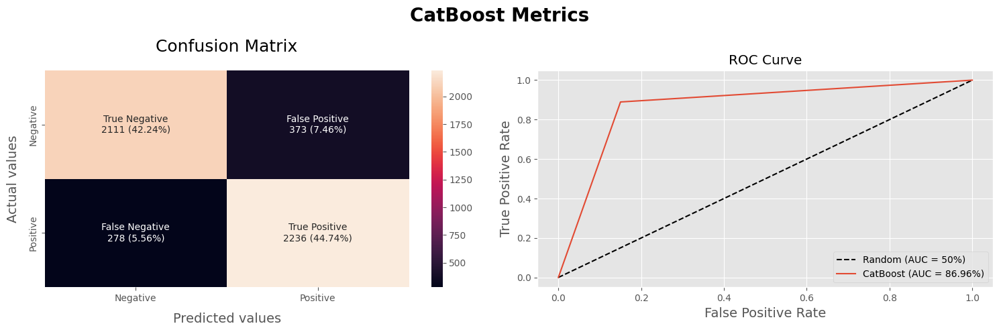



 CatBoost Classification Report: 

               precision    recall  f1-score   support



    Negative       0.88      0.85      0.87      2484

    Positive       0.86      0.89      0.87      2514



    accuracy                           0.87      4998

   macro avg       0.87      0.87      0.87      4998

weighted avg       0.87      0.87      0.87      4998




In [ ]:
catPreds = cat.predict(X_test)

make_classification_plots(y_test, catPreds, 'CatBoost')

# **Fine-Tuning Best Models**

- **Interstingly the Linear Models outperformed the boostings ones so we will try to fine-tune them.**

### **Logistic Regression**

In [ ]:
from sklearn.model_selection import GridSearchCV

param_lr = [ {
                'penalty' : ['l2'],
                'C' : [0.001, 0.01, 0.1, 1, 10],
                'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
                }
              ]

lr = LogisticRegression(random_state=0, max_iter=500)

lr_grid_search = GridSearchCV(lr, param_lr, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

lr_grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=500, random_state=0),
             n_jobs=-1,
             param_grid=[{'C': [0.001, 0.01, 0.1, 1, 10], 'penalty': ['l2'],
                          'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                     'saga']}],
             scoring='accuracy', verbose=1)

In [ ]:
lr_grid_search.best_score_

0.87127274585023

In [ ]:
lr_grid_search.best_params_

{'C': 1, 'penalty': 'l2', 'solver': 'saga'}

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=500, C = 1, penalty= 'l2', solver= 'saga')

lr.fit(X_train, y_train)

test_performence(lr)

,Accuracy,Roc Score
Train,0.926629,0.926794
Val,0.896552,0.896562
Test,0.890356,0.890786


,Model Cross-Val Scores
count,3.000000
mean,0.891729
std,0.000537
min,0.891192
25%,0.891460
50%,0.891729
75%,0.891997
max,0.892265


[Summary Statistics]
Accuracy = 89.04% | Precision = 87.92% | Recall = 90.65% | Specificity = 87.40% | F1 Score = 89.27%


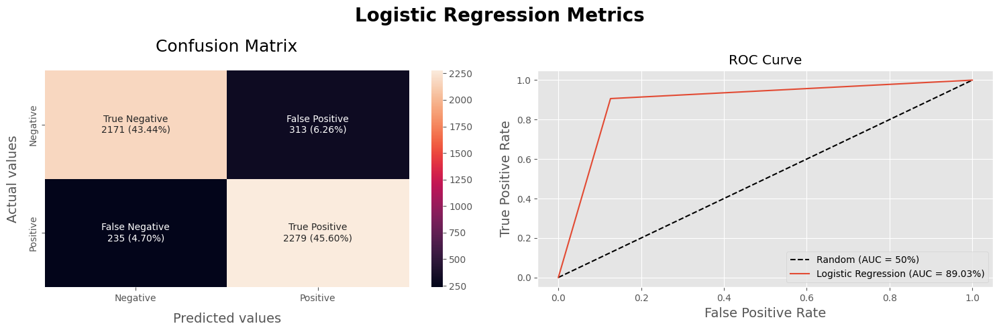


 Logistic Regression Classification Report: 
               precision    recall  f1-score   support

    Negative       0.90      0.87      0.89      2484
    Positive       0.88      0.91      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
lrPreds = lr.predict(X_test)

make_classification_plots(y_test, lrPreds, 'Logistic Regression')

### **SGD Classifier**

In [ ]:
param_sgd = [ {
                'loss' : ['hinge', 'log_loss', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error', 'huber'],
                'alpha': [0.00001 , 0.0001, 0.001, 0.01, 0.1, 1],
                'n_jobs': [-1],
                'early_stopping' : [True],
                }
              ]

sgd = SGDClassifier(random_state=0)

sgd_grid_search = GridSearchCV(sgd, param_sgd, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

sgd_grid_search.fit(X_train, y_train)

In [ ]:
sgd_grid_search.best_score_

0.8697622633794828

In [ ]:
sgd_grid_search.best_params_

{'alpha': 0.001,
 'early_stopping': True,
 'loss': 'modified_huber',
 'n_jobs': -1}

In [ ]:
sgd = SGDClassifier(random_state=0, alpha = 0.001, early_stopping = True, loss= 'modified_huber', n_jobs = -1)

sgd.fit(X_train, y_train)

test_performence(sgd)

,Accuracy,Roc Score
Train,0.896531,0.899975
Val,0.881450,0.884350
Test,0.874750,0.879341


,Model Cross-Val Scores
count,3.000000
mean,0.882181
std,0.004596
min,0.877641
25%,0.879855
50%,0.882069
75%,0.884450
max,0.886832


[Summary Statistics]
Accuracy = 87.47% | Precision = 83.91% | Recall = 92.92% | Specificity = 81.96% | F1 Score = 88.18%


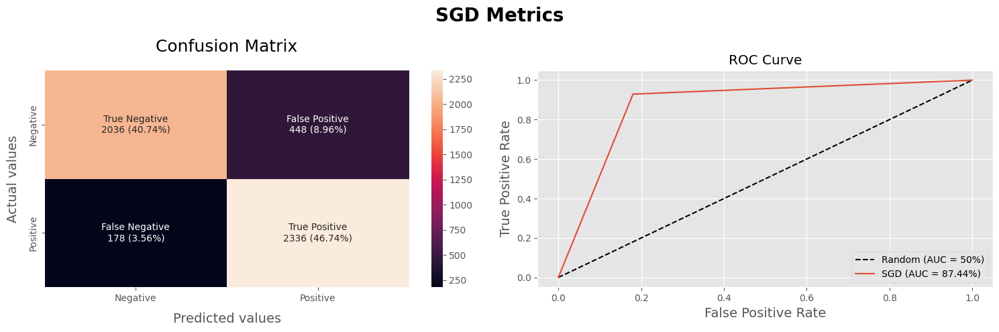


 SGD Classification Report: 
               precision    recall  f1-score   support

    Negative       0.92      0.82      0.87      2484
    Positive       0.84      0.93      0.88      2514

    accuracy                           0.87      4998
   macro avg       0.88      0.87      0.87      4998
weighted avg       0.88      0.87      0.87      4998



In [ ]:
sgdPreds = sgd.predict(X_test)

make_classification_plots(y_test, sgdPreds, 'SGD')

### **LinearSVC**

In [ ]:
param_svc = [ {
                'loss' : [ 'squared_hinge'],
                'C': [0.001, 0.1, 1, 10, 100],
                'penalty': ['l2'],
                'dual' : [False],
                }
              ]           

svc = LinearSVC(random_state=0)

svc_grid_search = GridSearchCV(svc, param_svc, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

svc_grid_search.fit(X_train, y_train)

In [ ]:
svc_grid_search.best_score_

0.8717762400071458

In [ ]:
svc_grid_search.best_params_

{'C': 0.1, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [ ]:
svc = LinearSVC(random_state=0, C = 0.1, dual = False, loss= 'squared_hinge', penalty= 'l2')

svc.fit(X_train, y_train)

test_performence(svc)

,Accuracy,Roc Score
Train,0.929231,0.929420
Val,0.896300,0.896318
Test,0.891957,0.892573


,Model Cross-Val Scores
count,3.000000
mean,0.893629
std,0.000254
min,0.893339
25%,0.893540
50%,0.893741
75%,0.893775
max,0.893808


[Summary Statistics]
Accuracy = 89.20% | Precision = 87.85% | Recall = 91.13% | Specificity = 87.24% | F1 Score = 89.46%


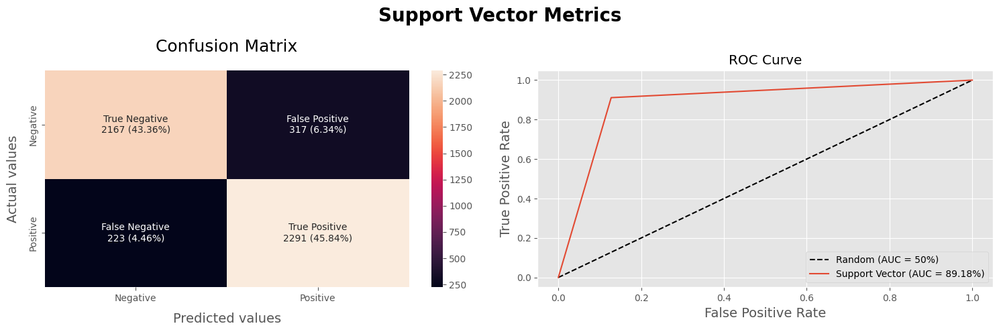


 Support Vector Classification Report: 
               precision    recall  f1-score   support

    Negative       0.91      0.87      0.89      2484
    Positive       0.88      0.91      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
svcPreds = svc.predict(X_test)

make_classification_plots(y_test, svcPreds, 'Support Vector')

# **Boosting Fine-Tuned Models**

- **After Fine-Tuning we will boost the models performence with boostings methods.**

In [40]:
from sklearn.ensemble import VotingClassifier,StackingClassifier

In [42]:
estimators = [('lr', LogisticRegression(random_state=0, max_iter=500, C = 1, penalty= 'l2', solver= 'saga')),
              ('sgd', SGDClassifier(random_state=0)),
              ('svc', LinearSVC(random_state=0, C = 0.1, dual = False, loss= 'squared_hinge', penalty= 'l2')),
#               ('ridge', RidgeClassifier(random_state=0)),
             ]

stack_model = StackingClassifier(estimators=estimators, final_estimator = LogisticRegression(random_state=0, max_iter=500)
                                 ,n_jobs =1, verbose = False, passthrough=True)

stack_model.fit(X_train,y_train)

StackingClassifier(estimators=[('lr',
                                LogisticRegression(C=1, max_iter=500,
                                                   random_state=0,
                                                   solver='saga')),
                               ('sgd', SGDClassifier(random_state=0)),
                               ('svc',
                                LinearSVC(C=0.1, dual=False, random_state=0))],
                   final_estimator=LogisticRegression(max_iter=500,
                                                      random_state=0),
                   n_jobs=1, passthrough=True, verbose=False)

In [ ]:
test_performence(stack_model)

,Accuracy,Roc Score
Train,0.933231,0.933259
Val,0.892525,0.892527
Test,0.893357,0.893525


,Model Cross-Val Scores
count,3.000000
mean,0.891572
std,0.001703
min,0.890186
25%,0.890622
50%,0.891058
75%,0.892265
max,0.893473


[Summary Statistics]
Accuracy = 89.34% | Precision = 88.68% | Recall = 90.33% | Specificity = 88.33% | F1 Score = 89.50%


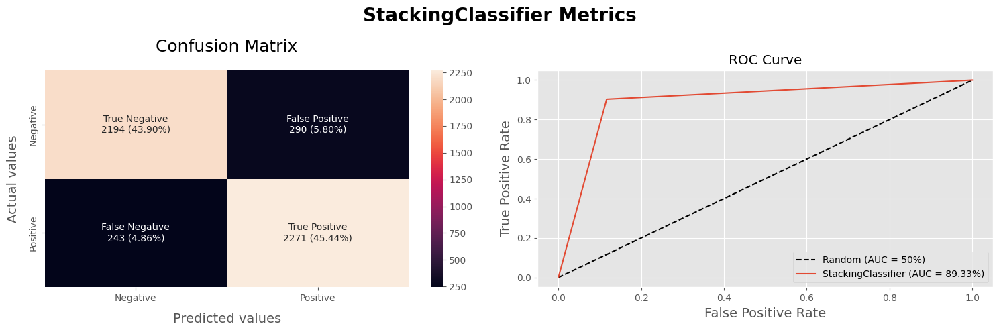


 StackingClassifier Classification Report: 
               precision    recall  f1-score   support

    Negative       0.90      0.88      0.89      2484
    Positive       0.89      0.90      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
StackPreds = stack_model.predict(X_test)

make_classification_plots(y_test, StackPreds, 'StackingClassifier')

In [44]:
estimators = [('lr', lr),
              ('sgd', SGDClassifier(random_state=0)),
              ('svc', svc),
             ]

voting_model = VotingClassifier(estimators=estimators, n_jobs =-1, verbose = False)

voting_model.fit(X_train,y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1, max_iter=500,
                                                 random_state=0,
                                                 solver='saga')),
                             ('sgd', SGDClassifier(random_state=0)),
                             ('svc',
                              LinearSVC(C=0.1, dual=False, random_state=0))],
                 n_jobs=-1)

In [ ]:
voting_model.fit(X_train,y_train)

test_performence(voting_model)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


,Accuracy,Roc Score
Train,0.925818,0.926124
Val,0.893280,0.893405
Test,0.889556,0.890244


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


,Model Cross-Val Scores
count,3.000000
mean,0.891036
std,0.001135
min,0.889783
25%,0.890555
50%,0.891326
75%,0.891662
max,0.891997


[Summary Statistics]
Accuracy = 88.96% | Precision = 87.53% | Recall = 91.01% | Specificity = 86.88% | F1 Score = 89.24%


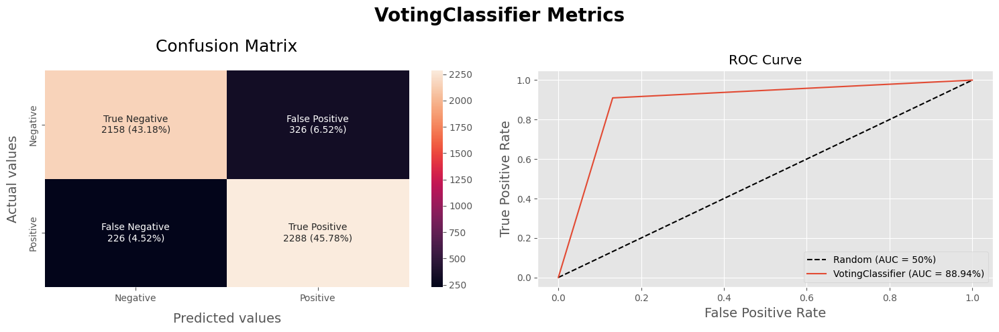


 VotingClassifier Classification Report: 
               precision    recall  f1-score   support

    Negative       0.91      0.87      0.89      2484
    Positive       0.88      0.91      0.89      2514

    accuracy                           0.89      4998
   macro avg       0.89      0.89      0.89      4998
weighted avg       0.89      0.89      0.89      4998



In [ ]:
votingPreds = voting_model.predict(X_test)

make_classification_plots(y_test, votingPreds, 'VotingClassifier')

- The `StackingClassifier` seems to have the best performence boosting our models.

# **Deep Learning Models**

# **Data Preprocessing**

In [46]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val ,y_train ,y_val = train_test_split(train_data['cleanPipelineTokens'], train_data['label'], test_size=0.1,
                                                    stratify= train_data['label']  , random_state=0)

In [ ]:
train_sentences = X_train
train_labels = y_train

val_sentences = X_val
val_labels = y_val

test_sentences = val_data['cleanPipelineTokens']
test_labels = val_data['label']

In [ ]:
train_sentences.shape, train_labels.shape, val_sentences.shape, val_labels.shape, test_sentences.shape, test_labels.shape

((35750,), (35750,), (3973,), (3973,), (4998,), (4998,))

In [ ]:
max_len = np.max( train_data['cleanPipelineTokens'].apply( lambda x :len(x) ) )
max_len

8496

In [ ]:
tokenizer = Tokenizer(oov_token = '<OOV>')

tokenizer.fit_on_texts(train_sentences)

word_index = tokenizer.word_index

# total vocabulary size + padding token
num_features = len(tokenizer.index_word) + 1
print(num_features)

110781


In [ ]:
# Saving the keras tokenizer for deployment
import joblib

# Convert Tokenizer to a dictionary
tokenizer_dict = tokenizer.to_json()

# Save the Tokenizer dictionary using joblib
joblib.dump(tokenizer_dict, open('keras_tokenizer.pkl', 'wb'), compress=3)

In [ ]:
vocab_size = num_features

max_length = max_len

embedding_dim = 16

padding_type='post'

truncating_type="pre"

In [ ]:
# Creates sequences of numeric representations of words
train_sequences = tokenizer.texts_to_sequences(train_sentences)

# pads sequences so they all have the same length
padded_train_sequences = pad_sequences(train_sequences, maxlen = max_length, padding = padding_type, truncating = truncating_type)

val_sequences = tokenizer.texts_to_sequences(val_sentences)

padded_val_sentences = pad_sequences(val_sequences, maxlen = max_length, padding = padding_type, truncating = truncating_type)

test_sequences = tokenizer.texts_to_sequences(test_sentences)

padded_test_sentences = pad_sequences(test_sequences, maxlen = max_length, padding = padding_type, truncating = truncating_type)

In [ ]:
#prints a sample of the new sequences
print('PROCESSED TEXT DATA')
print('=========================')
for i in range(5):
    print(train_sequences[i], '\n')

PROCESSED TEXT DATA


[7, 5, 2, 26, 193, 41, 62, 25, 191, 183, 191, 739, 60, 485, 408, 34, 6, 7, 296, 2407, 1669, 6358, 16249, 832, 22, 46780, 23641, 2, 2559, 46781, 170, 5, 94, 41, 761, 734, 1033, 6651, 761, 2489, 1470, 1665, 7, 3746, 395, 1241, 11189, 145, 3117, 804, 395, 1167, 2092, 705, 2625, 182, 408, 847, 2837, 311, 278, 145, 64, 237, 1679, 2616, 29533, 7756, 1057, 5248, 156, 5970, 9758, 5, 146, 745, 46782, 408, 11, 21709, 1409, 289, 659, 1397, 180, 2339, 819, 3389, 5908, 52, 73, 8, 327, 843, 11190, 371, 393, 404, 1417, 3557, 175, 3357, 4105, 931, 1814, 4, 175, 425, 2186, 73, 14, 46783, 1228, 167, 134, 158, 17, 30, 847, 17, 40, 63, 1299, 26, 4211, 1360, 29534, 405, 79, 148, 435, 202, 41, 46784, 330, 73, 8, 5, 847, 98, 247, 659, 449, 1151, 6819, 4528, 1656, 6736, 1632, 843, 1019, 38, 46785, 1259, 3907, 1540, 15540, 102, 14335, 46786, 8877, 2960, 1814, 6036, 4426, 17034, 13395, 556, 105, 958, 1814, 562, 2200, 216, 6, 13830, 4984, 763, 1409, 2824, 46787, 1019, 35079, 7097, 5249, 178

# **CNN Model**

In [49]:
CNN_Model = tf.keras.Sequential([
    
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length = max_length),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Conv1D(16, 5, activation='relu'),

    # tf.keras.layers.Conv1D(32, 5, activation='relu'),

    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(32, activation = 'relu'),
    tf.keras.layers.Dropout(0.2),

    # tf.keras.layers.Dense(32, activation = 'relu'),
    # tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Dense(1, activation = 'sigmoid'),

])

CNN_Model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

CNN_Model.summary()

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 embedding (Embedding)       (None, 8496, 16)          1772496   

                                                                 

 dropout (Dropout)           (None, 8496, 16)          0         

                                                                 

 conv1d (Conv1D)             (None, 8492, 16)          1296      

                                                                 

 global_average_pooling1d (G  (None, 16)               0         

 lobalAveragePooling1D)                                          

                                                                 

 dropout_1 (Dropout)         (None, 16)                0         

                                                                 

 dense (Dense)               (None, 32)                544       

                                        

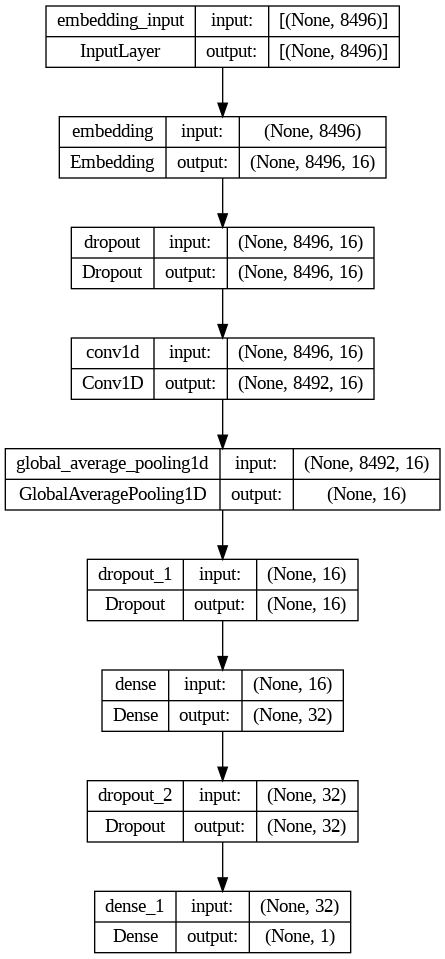

In [50]:
from tensorflow.keras.utils import plot_model

plot_model(CNN_Model,"model.png", show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_accuracy', patience = 5, restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = tf.keras.callbacks.ReduceLROnPlateau( monitor='val_loss',
                                                  factor=0.5,
                                                  patience=3,
                                                  min_lr=0.00005,
                                                  verbose=1)

callbacks = [Early_Stopping, Reducing_LR]

In [ ]:
CNN_history = CNN_Model.fit(padded_train_sequences, train_labels, epochs = 50, batch_size = 256,
                            validation_data=(padded_val_sentences, val_labels), verbose=1, callbacks = callbacks)

Epoch 1/50
140/140 [==============================] - 40s 272ms/step - loss: 0.6932 - accuracy: 0.4984 - val_loss: 0.6931 - val_accuracy: 0.4989 - lr: 0.0010
Epoch 2/50
140/140 [==============================] - 32s 225ms/step - loss: 0.6898 - accuracy: 0.5597 - val_loss: 0.6762 - val_accuracy: 0.7322 - lr: 0.0010
Epoch 3/50
140/140 [==============================] - 28s 201ms/step - loss: 0.5858 - accuracy: 0.7580 - val_loss: 0.4450 - val_accuracy: 0.8530 - lr: 0.0010
Epoch 4/50
140/140 [==============================] - 25s 180ms/step - loss: 0.3938 - accuracy: 0.8435 - val_loss: 0.3262 - val_accuracy: 0.8817 - lr: 0.0010
Epoch 5/50
140/140 [==============================] - 22s 157ms/step - loss: 0.3173 - accuracy: 0.8752 - val_loss: 0.2916 - val_accuracy: 0.8877 - lr: 0.0010
Epoch 6/50
140/140 [==============================] - 17s 123ms/step - loss: 0.2829 - accuracy: 0.8915 - val_loss: 0.2758 - val_accuracy: 0.8923 - lr: 0.0010
Epoch 7/50
140/140 [==============================] 

In [ ]:
CNN_Scores = CNN_Model.evaluate(padded_test_sentences, test_labels)

print("    Test Loss: {:.5f}".format(CNN_Scores[0]))
print("Test Accuracy: {:.2f}%".format(CNN_Scores[1] * 100))

157/157 [==============================] - 1s 4ms/step - loss: 0.2722 - accuracy: 0.9008
    Test Loss: 0.27225
Test Accuracy: 90.08%


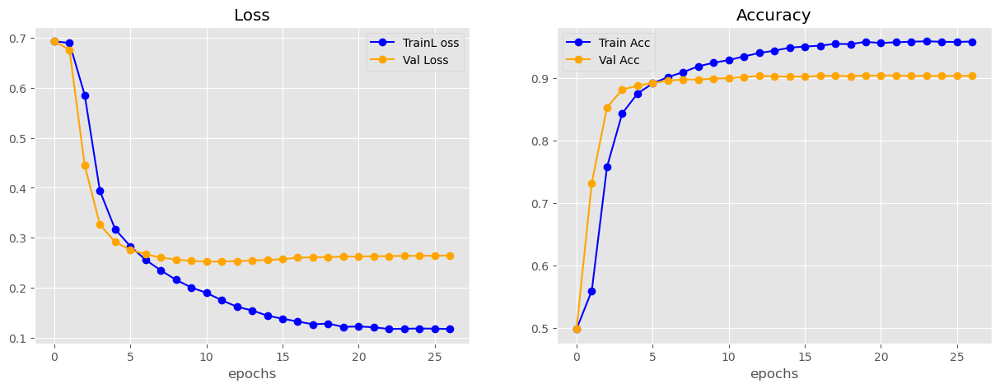

In [ ]:
def plot_curves(history):

  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  plt.figure(figsize=(15,5))
  plt.style.use('ggplot')

  #plot loss
  plt.subplot(1, 2, 1)
  plt.plot(epochs, loss, 'bo-' , label = "TrainL oss")
  plt.plot(epochs, val_loss, 'o-' , color='orange', label = "Val Loss")
  plt.title("Loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.subplot(1, 2, 2)
  plt.plot(epochs, accuracy, 'bo-' , label = "Train Acc")
  plt.plot(epochs, val_accuracy, 'o-' , color='orange' , label = "Val Acc")
  plt.title("Accuracy")
  plt.xlabel("epochs")
  plt.legend()
  
  #plt.tight_layout()

plot_curves(CNN_history)

In [ ]:
CNN_Predictions_Probs = CNN_Model.predict(padded_test_sentences)

CNN_Predictions = [1 if pred > 0.50 else 0 for pred in CNN_Predictions_Probs]

CNN_Predictions[:5]

157/157 [==============================] - 0s 3ms/step


[0, 0, 0, 0, 1]

[Summary Statistics]
Accuracy = 90.08% | Precision = 89.23% | Recall = 91.29% | Specificity = 88.85% | F1 Score = 90.25%


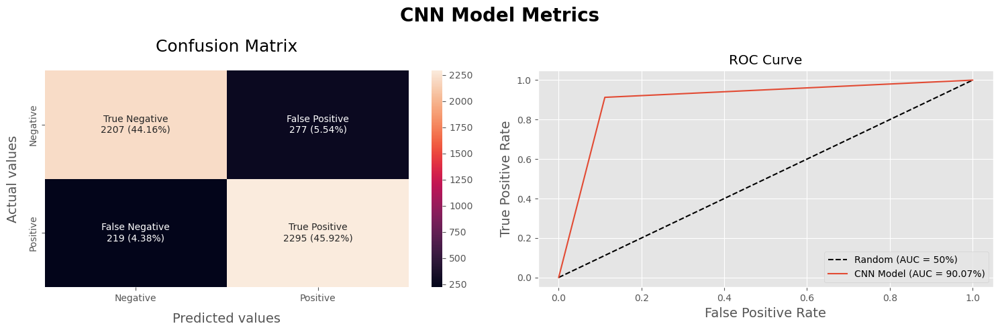


 CNN Model Classification Report: 
               precision    recall  f1-score   support

    Negative       0.91      0.89      0.90      2484
    Positive       0.89      0.91      0.90      2514

    accuracy                           0.90      4998
   macro avg       0.90      0.90      0.90      4998
weighted avg       0.90      0.90      0.90      4998



In [ ]:
make_classification_plots(test_labels, CNN_Predictions, 'CNN Model')

In [ ]:
CNN_Model.save('CNN_Model.h5')

# **LSTM Model**

In [ ]:
LSTM_Model = tf.keras.Sequential([
        tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length = max_length),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Bidirectional( tf.keras.layers.LSTM(64, dropout=0.3, activation="tanh")),

        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),


        tf.keras.layers.Dense(1, activation='sigmoid')
])

LSTM_Model.compile(loss = 'binary_crossentropy', optimizer = tf.keras.optimizers.experimental.AdamW(0.0001), metrics = ['accuracy'])

LSTM_Model.summary()

Model: "sequential_1"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 embedding_1 (Embedding)     (None, 8496, 16)          1772496   

                                                                 

 dropout_2 (Dropout)         (None, 8496, 16)          0         

                                                                 

 bidirectional (Bidirectiona  (None, 128)              41472     

 l)                                                              

                                                                 

 dropout_3 (Dropout)         (None, 128)               0         

                                                                 

 dense_2 (Dense)             (None, 64)                8256      

                                                                 

 dropout_4 (Dropout)         (None, 64)                0         

                                      

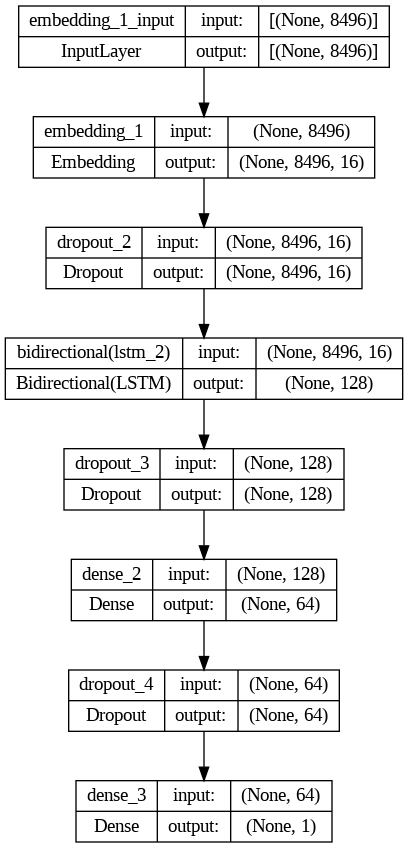

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(LSTM_Model,"model.png", show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_accuracy', patience = 3, restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = tf.keras.callbacks.ReduceLROnPlateau( monitor='val_loss',
                                                  factor=0.5,
                                                  patience=2,
                                                  min_lr=0.00005,
                                                  verbose=1)

callbacks = [Early_Stopping, Reducing_LR]

In [ ]:
LSTM_history = LSTM_Model.fit(padded_train_sequences, train_labels, epochs = 20, batch_size = 256,
                            validation_data=(padded_val_sentences, val_labels), verbose=1, callbacks = callbacks)

Epoch 1/20

140/140 [==============================] - 124s 813ms/step - loss: 0.6929 - accuracy: 0.5121 - val_loss: 0.6923 - val_accuracy: 0.5469 - lr: 1.0000e-04

Epoch 2/20

140/140 [==============================] - 110s 783ms/step - loss: 0.6600 - accuracy: 0.6397 - val_loss: 0.5902 - val_accuracy: 0.6703 - lr: 1.0000e-04

Epoch 3/20

140/140 [==============================] - 109s 778ms/step - loss: 0.4696 - accuracy: 0.7951 - val_loss: 0.3687 - val_accuracy: 0.8580 - lr: 1.0000e-04

Epoch 4/20

140/140 [==============================] - 108s 768ms/step - loss: 0.3453 - accuracy: 0.8599 - val_loss: 0.3199 - val_accuracy: 0.8754 - lr: 1.0000e-04

Epoch 5/20

140/140 [==============================] - 114s 811ms/step - loss: 0.2966 - accuracy: 0.8820 - val_loss: 0.3003 - val_accuracy: 0.8799 - lr: 1.0000e-04

Epoch 6/20

140/140 [==============================] - 106s 759ms/step - loss: 0.2712 - accuracy: 0.8953 - val_loss: 0.2955 - val_accuracy: 0.8817 - lr: 1.0000e-04

Epoch 7/20

In [ ]:
LSTM_Scores = LSTM_Model.evaluate(padded_test_sentences, test_labels)

print("    Test Loss: {:.5f}".format(LSTM_Scores[0]))
print("Test Accuracy: {:.2f}%".format(LSTM_Scores[1] * 100))

157/157 [==============================] - 27s 169ms/step - loss: 0.2952 - accuracy: 0.8960

    Test Loss: 0.29517

Test Accuracy: 89.60%


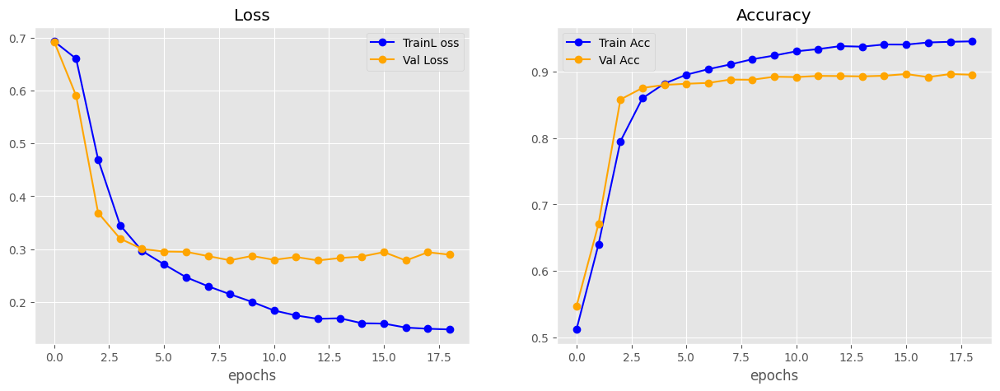

In [ ]:
plot_curves(LSTM_history)

In [ ]:
LSTM_Predictions_Probs = LSTM_Model.predict(padded_test_sentences)

LSTM_Predictions = [1 if pred > 0.50 else 0 for pred in LSTM_Predictions_Probs]

LSTM_Predictions[:5]

157/157 [==============================] - 34s 204ms/step


[0, 0, 0, 0, 1]

[Summary Statistics]

Accuracy = 89.60% | Precision = 89.66% | Recall = 89.66% | Specificity = 89.53% | F1 Score = 89.66%


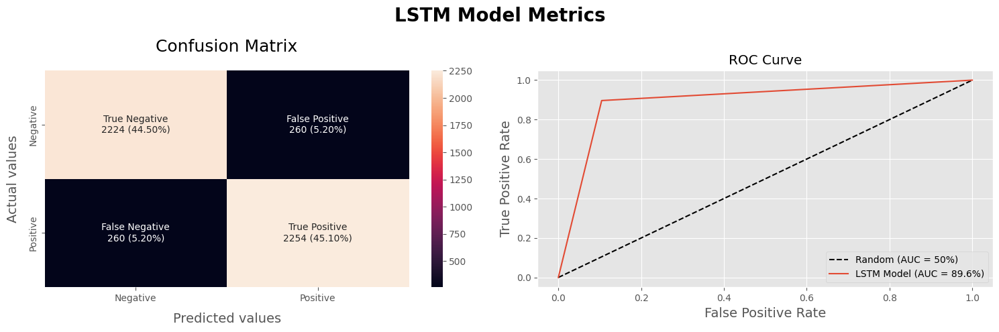



 LSTM Model Classification Report: 

               precision    recall  f1-score   support



    Negative       0.90      0.90      0.90      2484

    Positive       0.90      0.90      0.90      2514



    accuracy                           0.90      4998

   macro avg       0.90      0.90      0.90      4998

weighted avg       0.90      0.90      0.90      4998




In [ ]:
make_classification_plots(test_labels, LSTM_Predictions, 'LSTM Model')

In [ ]:
LSTM_Model.save('LSTM_Model.h5')

- **Outstandigly, Our Deep Nueral Networks have nearly the same performence compared to our ML Boosting Model.**

# **Making New Predictions Pipeline**

- **We will make two pipelines for our ML and DL models to be ready to be deployed to a  `FastAPI`**

# **Machine Learning New Predictions**

In [ ]:
Vectorizer = TfidfVectorizer(max_features=5000, min_df=0.0001, max_df=0.7, ngram_range=(1,3))

Vectorizer.fit_transform(train_data['cleanPipelineTokens'])

In [ ]:
import joblib

joblib.dump(Vectorizer , open('Tfidf_Vectorizer.pkl', 'wb') )

In [ ]:
model = LogisticRegression(random_state=0, max_iter=500)

model.fit(X_allData, y_allData)

joblib.dump(model , open('model.pkl', 'wb') )

In [ ]:
# --Preparing Preprocessing--
html_pattern = re.compile(r'<.*?>')
url_pattern = re.compile(r'(https?://\S+)|(www\.\S+)|(\S+\.\S+/\S+)')
emoji_pattern = re.compile("["
                              u"\U0001F600-\U0001F64F"  # emoticons
                              u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                              u"\U0001F680-\U0001F6FF"  # transport & map symbols
                              u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                              u"\U00002702-\U000027B0"  # other miscellaneous symbols
                              u"\U000024C2-\U0001F251"  # enclosed characters
                            "]+", flags=re.UNICODE)
punkt_pattern = re.compile(r"[^\w\s]")
STOPWORDS = set(stopwords.words('english'))
lemmatizer = nltk.stem.wordnet.WordNetLemmatizer()
stemmer = PorterStemmer()

def make_new_ml_predictions(inputText):
  
    # --Tokenization--
    tokens = nltk.word_tokenize(inputText)

    # --Cleaning Tokens--
    htmlTokensRm = ( [ html_pattern.sub(r'', word) for word in tokens ] ) # Remove tokens containing html tags

    urlTokensRm = ( [ url_pattern.sub(r'', word) for word in htmlTokensRm ] ) # Remove tokens containing urls

    emojiTokensRm = ( [ emoji_pattern.sub(r'', word) for word in urlTokensRm ] ) # Remove tokens containing emojis

    punktTokensRm = ( [ punkt_pattern.sub(r'', word) for word in emojiTokensRm ] ) # Remove tokens containing Punctuations

    stopWordsRm = ( [ word for word in punktTokensRm if word not in STOPWORDS ] ) # Remove tokens containing stopwords

    lemmtizedTokensRm = ( [ lemmatizer.lemmatize(word) for word in stopWordsRm ] ) # Lemmatize Tokens

    stemmedTokensRm = ( [ stemmer.stem(word) for word in lemmtizedTokensRm ] ) # Stem Tokens

    ReapeatTokensRm = ( [ re.sub(r'(\w)\1{2,}', r'\1', word) for word in stemmedTokensRm] )  # Remove repeating characters from tokens

    digitTokensRm = ( [ word for word in ReapeatTokensRm if not re.search(r'\d', word) ] ) # Remove tokens containing digits

    underscoreTokensRm = ( [ word for word in digitTokensRm if not re.search(r'_|\w*_\w*', word) ] ) # Remove tokens containing underscore

    specialTokensRm = ( [ word for word in underscoreTokensRm if not re.search(r'[^a-zA-Z0-9\s]', word) ] ) # Remove tokens containing Special Characters
    
    cleanTokens = ( [ word for word in specialTokensRm if len(word) > 2 ] )  # Remove tokens less than 2 characters

    # --Vectorizing Tokens--
    Tfidf_Vectorizer = joblib.load(open('Tfidf_Vectorizer.pkl', 'rb'))

    tokensVectorized = Tfidf_Vectorizer.transform( [" ".join(cleanTokens)] ).toarray()

    # --Predicting Tokens Class--
    model = joblib.load(open('model.pkl', 'rb'))

    prediction = model.predict(tokensVectorized)

    categories = ['Negative', 'Positive']

    return categories[prediction[0]]

In [51]:
train_data.head(10)

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1
5,A terrible movie as everyone has said. What ma...,0
6,Finally watched this shocking movie last night...,1
7,I caught this film on AZN on cable. It sounded...,0
8,It may be the remake of 1987 Autumn's Tale aft...,1
9,My Super Ex Girlfriend turned out to be a plea...,1


In [ ]:
print("Actual:", train_data.loc[0][1])

print("Predicted:", make_new_predictions(train_data.loc[0][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", train_data.loc[1][1])

print("Predicted:", make_new_ml_predictions(train_data.loc[1][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", train_data.loc[4][1])

print("Predicted:", make_new_ml_predictions(train_data.loc[4][0]))

Actual: 1

Predicted: Positive


In [52]:
val_data.head(10)

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0
5,This is the best movie I've ever seen! <br /><...,1
6,The morbid Catholic writer Gerard Reve (Jeroen...,1
7,"""Semana Santa"" or ""Angel Of Death"" is a very w...",0
8,Somebody mastered the difficult task of mergin...,1
9,Why did I waste 1.5 hours of my life watching ...,0


In [ ]:
print("Actual:", val_data.loc[0][1])

print("Predicted:", make_new_ml_predictions(val_data.loc[0][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", val_data.loc[1][1])

print("Predicted:", make_new_ml_predictions(val_data.loc[1][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", val_data.loc[5][1])

print("Predicted:", make_new_ml_predictions(val_data.loc[5][0]))

Actual: 1

Predicted: Positive


In [ ]:
make_new_ml_predictions("From my opinion it was the best movie I have seen in a while")

1/1 [==============================] - 0s 152ms/step


'Positive'

In [ ]:
make_new_ml_predictions("Worst movie ever, I will never recommend it to anyone")

1/1 [==============================] - 0s 71ms/step


'Negative'

- **Our ML Prediction Function gives same results compared to the original data.**



---



# **Deep Learning New Predictions**

In [ ]:
import keras
from keras.preprocessing.text import tokenizer_from_json

max_length = 8496
padding_type='post'
truncating_type="pre"

def make_new_dl_predictions(inputText):

    # --Preparing Preprocessing--
    html_pattern = re.compile(r'<.*?>')
    url_pattern = re.compile(r'(https?://\S+)|(www\.\S+)|(\S+\.\S+/\S+)')
    emoji_pattern = re.compile("["
                                  u"\U0001F600-\U0001F64F"  # emoticons
                                  u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                  u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                  u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                  u"\U00002702-\U000027B0"  # other miscellaneous symbols
                                  u"\U000024C2-\U0001F251"  # enclosed characters
                                "]+", flags=re.UNICODE)
    punkt_pattern = re.compile(r"[^\w\s]")
    STOPWORDS = set(stopwords.words('english'))
    lemmatizer = nltk.stem.wordnet.WordNetLemmatizer()
    stemmer = PorterStemmer()

    # --Tokenization--
    tokens = nltk.word_tokenize(inputText)

    # --Cleaning Tokens--
    htmlTokensRm = ( [ html_pattern.sub(r'', word) for word in tokens ] ) # Remove tokens containing html tags

    urlTokensRm = ( [ url_pattern.sub(r'', word) for word in htmlTokensRm ] ) # Remove tokens containing urls

    emojiTokensRm = ( [ emoji_pattern.sub(r'', word) for word in urlTokensRm ] ) # Remove tokens containing emojis

    punktTokensRm = ( [ punkt_pattern.sub(r'', word) for word in emojiTokensRm ] ) # Remove tokens containing Punctuations

    stopWordsRm = ( [ word for word in punktTokensRm if word not in STOPWORDS ] ) # Remove tokens containing stopwords

    lemmtizedTokensRm = ( [ lemmatizer.lemmatize(word) for word in stopWordsRm ] ) # Lemmatize Tokens

    stemmedTokensRm = ( [ stemmer.stem(word) for word in lemmtizedTokensRm ] ) # Stem Tokens

    ReapeatTokensRm = ( [ re.sub(r'(\w)\1{2,}', r'\1', word) for word in stemmedTokensRm] )  # Remove repeating characters from tokens

    digitTokensRm = ( [ word for word in ReapeatTokensRm if not re.search(r'\d', word) ] ) # Remove tokens containing digits

    underscoreTokensRm = ( [ word for word in digitTokensRm if not re.search(r'_|\w*_\w*', word) ] ) # Remove tokens containing underscore

    specialTokensRm = ( [ word for word in underscoreTokensRm if not re.search(r'[^a-zA-Z0-9\s]', word) ] ) # Remove tokens containing Special Characters
    
    cleanTokens = ( [ word for word in specialTokensRm if len(word) > 2 ] )  # Remove tokens less than 2 characters

    # --Vectorizing Tokens--
    cleanSentence = [" ".join(cleanTokens)]

    # Load the Tokenizer dictionary
    tokenizer_dict = joblib.load(open('keras_tokenizer.pkl', 'rb'))

    # Convert the dictionary back to a Tokenizer object
    tokenizer = tokenizer_from_json(tokenizer_dict)

    sentence_sequences = tokenizer.texts_to_sequences(cleanSentence)

    padded_sentence_sentences = pad_sequences(sentence_sequences, maxlen = max_length, padding = padding_type, truncating = truncating_type)

    # --Predicting Review Class--
    dl_model = keras.models.load_model('dl_model.h5')

    predictionsProbs = dl_model.predict(padded_sentence_sentences)

    prediction = [1 if pred > 0.50 else 0 for pred in predictionsProbs]

    categories = ['Negative', 'Positive']

    return categories[prediction[0]]

In [ ]:
print("Actual:", train_data.loc[0][1])

print("Predicted:", make_new_dl_predictions(train_data.loc[0][0]))

In [ ]:
print("Actual:", train_data.loc[1][1])

print("Predicted:", make_new_dl_predictions(train_data.loc[1][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", train_data.loc[4][1])

print("Predicted:", make_new_dl_predictions(train_data.loc[4][0]))

Actual: 1

Predicted: Positive


In [ ]:
print("Actual:", val_data.loc[0][1])

print("Predicted:", make_new_dl_predictions(val_data.loc[0][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", val_data.loc[1][1])

print("Predicted:", make_new_dl_predictions(val_data.loc[1][0]))

Actual: 0

Predicted: Negative


In [ ]:
print("Actual:", val_data.loc[5][1])

print("Predicted:", make_new_dl_predictions(val_data.loc[5][0]))

Actual: 1

Predicted: Positive


In [ ]:
make_new_dl_predictions("From my opinion it was the best movie I have seen in a while")

1/1 [==============================] - 0s 152ms/step


'Positive'

In [ ]:
make_new_dl_predictions("Worst movie ever, I will never recommend it to anyone")

1/1 [==============================] - 0s 71ms/step


'Negative'

- **Also Our DL Prediction Function gives same results compared to the original data.**

# **Making Submission**

## **Preprocessing Test File**

In [34]:
test_data = pd.read_csv('/kaggle/input/shai-training-2023-a-level-2/Test.csv')

In [35]:
test_data

,id,text,label
0,0,I always wrote this series off as being a comp...,NaN
1,1,1st watched 12/7/2002 - 3 out of 10(Dir-Steve ...,NaN
2,2,This movie was so poorly written and directed ...,NaN
3,3,The most interesting thing about Miryang (Secr...,NaN
4,4,"when i first read about ""berlin am meer"" i did...",NaN
...,...,...,...
4995,4995,This is the kind of picture John Lassiter woul...,NaN
4996,4996,A MUST SEE! I saw WHIPPED at a press screening...,NaN
4997,4997,NBC should be ashamed. I wouldn't allow my chi...,NaN
4998,4998,This movie is a clumsy mishmash of various gho...,NaN


In [44]:
test_data_pred = test_data.copy()

test_data_pred['cleanPipelineTokens'] = test_data['text'].apply(cleanTextPipeline)

test_data_pred

,id,text,label,cleanPipelineTokens
0,0,I always wrote this series off as being a comp...,NaN,alway wrote seri complet stinkfest jim belushi...
1,1,1st watched 12/7/2002 - 3 out of 10(Dir-Steve ...,NaN,watch purcel typic mari kate ashley fare kiss ...
2,2,This movie was so poorly written and directed ...,NaN,thi movi poorli written direct fell asleep min...
3,3,The most interesting thing about Miryang (Secr...,NaN,the interest thing miryang secret sunshin acto...
4,4,"when i first read about ""berlin am meer"" i did...",NaN,first read berlin meer didnt expect much thoug...
...,...,...,...,...
4995,4995,This is the kind of picture John Lassiter woul...,NaN,thi kind pictur john lassit would make today w...
4996,4996,A MUST SEE! I saw WHIPPED at a press screening...,NaN,must see saw whip press screen hilari were tal...
4997,4997,NBC should be ashamed. I wouldn't allow my chi...,NaN,nbc asham wouldnt allow child see definit woul...
4998,4998,This movie is a clumsy mishmash of various gho...,NaN,thi movi clumsi mishmash variou ghoststori sus...


## **Deep Learning Predictions**

In [ ]:
comptest_sequences = tokenizer.texts_to_sequences(test_data_pred['cleanPipelineTokens'])

padded_comptest_sentences = pad_sequences(comptest_sequences, maxlen = max_length, padding = padding_type, truncating = truncating_type)

In [ ]:
CNN_Predictions_Probs = CNN_Model.predict(padded_comptest_sentences)

CNN_Predictions = [1 if pred > 0.50 else 0 for pred in CNN_Predictions_Probs]

157/157 [==============================] - 1s 6ms/step


## **Machine Learning Predictions**

In [45]:
compTestDataVectorized = Vectorizer.transform(test_data_pred['cleanPipelineTokens'])

feature_names = Vectorizer.get_feature_names_out()

pd.DataFrame(compTestDataVectorized.toarray(), columns = feature_names)

,aaron,abandon,abbott,abc,abduct,abil,abl,abl get,abl see,aboard,...,zani,zealand,zellweg,zero,zizek,zoey,zombi,zombi movi,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.066981,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4996,0.0,0.0,0.0,0.0,0.0,0.099801,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4997,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4998,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
feature_names[:1000]

array(['aaron', 'abandon', 'abbott', 'abc', 'abduct', 'abil', 'abl',
       'abl get', 'abl see', 'aboard', 'abomin', 'abort', 'abound',
       'about', 'aboutbr', 'abraham', 'abrupt', 'abruptli', 'absenc',
       'absent', 'absolut', 'absolut love', 'absolut noth',
       'absolut worst', 'absorb', 'abstract', 'absurd', 'abund', 'abus',
       'abysm', 'academi', 'academi award', 'accent', 'accept', 'access',
       'accid', 'accident', 'acclaim', 'accompani', 'accomplish',
       'accord', 'account', 'accur', 'accuraci', 'accus', 'ace', 'achiev',
       'acid', 'acknowledg', 'acquaint', 'acquir', 'across', 'act',
       'act abil', 'act also', 'act bad', 'act direct', 'act even',
       'act film', 'act good', 'act great', 'act horribl', 'act isnt',
       'act like', 'act movi', 'act one', 'act part', 'act perform',
       'act poor', 'act pretti', 'act realli', 'act skill', 'act superb',
       'act talent', 'act terribl', 'act the', 'act way', 'act well',
       'actingbr', 'actio

In [47]:
X_CompTest =  compTestDataVectorized.toarray()

In [ ]:
stack_model.fit(X_allData, y_allData)

stack_model.score(X_allData, y_allData)

In [ ]:
CompTestPreds = stack_model.predict(X_CompTest)

CompTestPreds.shape

## **Submission File**

In [ ]:
test_data = pd.read_csv('/kaggle/input/shai-training-2023-a-level-2/Test.csv')

In [ ]:
test_data['label'] = CompTestPreds

In [ ]:
test_data.drop(columns='text', inplace=True)

test_data

In [ ]:
test_data.to_csv('sub.csv', index = False)

- **Best Submission Scores**

 - **Voting Classifier with 20,000 Features with ngrams(1,3) ---> 90.3%**
 
 - **CNN Model with 16 Embedding Dimensions ---> 90.25%**